In [207]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [208]:
import os
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from dotenv import load_dotenv
from collections import Counter

# NLP and Text Processing
import nltk
from nltk import word_tokenize, pos_tag
from nltk.corpus import cmudict
from textblob import TextBlob
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import textstat
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

# Scikit-learn
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, accuracy_score, classification_report

# Local
from classes.song import Song
from classes.playlist import Playlist
from classes.spotify_manager import SpotifyManager
from classes.lyrics_manager import LyricsManager
from classes.utils import gather_data_from_folders

import warnings
warnings.simplefilter('ignore')
load_dotenv();

# Loading the data

In [209]:
df = pd.read_pickle(os.path.join('datasets', "final_data.pkl"))
print(f"Loaded {df.shape[0]} songs")
df.head()

Loaded 5888 songs


,id,title,artist,album_art_url,popularity,explicit,album_release_year,duration_ms,genres,lyrics,...,tfidf_41,tfidf_42,tfidf_43,tfidf_44,tfidf_45,tfidf_46,tfidf_47,tfidf_48,tfidf_49,genre
0,4RL77hMWUq35NYnPLXBpih,skinny love,birdy,https://i.scdn.co/image/ab67616d0000b2733661c0...,70.0,0,2011,201080,"['neo mellow', 'uk pop', 'viral pop']",come skinni love last year pour littl salt nev...,...,-0.000298,-0.015507,0.022181,0.020833,0.010477,-0.020431,-0.002047,0.008514,0.040827,pop
1,5PsjZ21f5tMPFf1sJpokm7,deathwish,red sun rising,https://i.scdn.co/image/ab67616d0000b273612f16...,NaN,0,2018,287946,"['modern hard rock', 'post-grunge']",life fleet slow chill us wave feed bone right ...,...,-0.015071,-0.057158,0.018369,0.010870,-0.001466,-0.015024,0.004207,0.109767,-0.002223,rock
2,6vrUTGn5p8IrfTZ0J6sIVM,iris,the goo goo dolls,https://i.scdn.co/image/ab67616d0000b273d54c4b...,71.0,0,2007,289906,"['neo mellow', 'permanent wave', 'pop rock', '...",id give forev touch caus know feel somehow you...,...,-0.031530,-0.110780,-0.058459,-0.035056,0.042887,0.005370,0.029647,0.037296,-0.065878,pop
3,0Leo4GP0UKG4tUABm9JATe,don't dream it's over,crowded house,https://i.scdn.co/image/ab67616d0000b27380ed24...,NaN,0,2017,231377,"['australian rock', 'permanent wave']",freedom within freedom without tri catch delug...,...,0.019574,-0.050210,-0.022823,0.037299,0.057974,0.007130,-0.033978,0.011495,0.066866,rock
4,0It6VJoMAare1zdV2wxqZq,undisclosed desires,muse,https://i.scdn.co/image/ab67616d0000b273b6d456...,65.0,0,2009,235000,"['alternative rock', 'modern rock', 'permanent...",know youv suffer dont want hide cold loveless ...,...,-0.026209,0.062922,-0.028253,-0.056556,0.024417,0.003067,0.024890,0.038374,-0.041446,rock


In [213]:
df.loc[df.popularity.isna(), 'popularity']  = df.popularity.median()

In [214]:
spotify_features = ['popularity', 'explicit',
       'album_release_year', 'duration_ms', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature']

lyrics_features = ['word_count',
       'unique_word_count', 'avg_word_length', 'syllable_count',
       'sentiment_polarity', 'sentiment_subjectivity', 'readability_score',
       'noun_ratio', 'verb_ratio', 'vader_compound', 'repetition_count',
       'average_syllables_per_word', 'language']

tfidf_features = [ f for f in df.columns if f.startswith("tfidf_") ]


audio_extracted_features = ['mfcc_1', 'mfcc_2',
       'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 'mfcc_9',
       'mfcc_10', 'mfcc_11', 'mfcc_12', 'mfcc_13', 'chroma_1', 'chroma_2',
       'chroma_3', 'chroma_4', 'chroma_5', 'chroma_6', 'chroma_7', 'chroma_8',
       'chroma_9', 'chroma_10', 'chroma_11', 'chroma_12',
       'spectral_contrast_1', 'spectral_contrast_2', 'spectral_contrast_3',
       'spectral_contrast_4', 'spectral_contrast_5', 'spectral_contrast_6',
       'spectral_contrast_7', 'tempo_extracted', 'zcr']

In [215]:
df.genre.value_counts()

pop             2588
rock             778
hip hop          710
r&b              277
indie            254
folk             229
country          228
dance            206
metal            105
latin             98
reggae            92
electronic        92
classical         60
jazz              58
experimental      51
alternative       40
grime             22
Name: genre, dtype: int64

## 1. Correlation Heatmap
Purpose:
The correlation heatmap is used to visualize the pairwise correlation between multiple numerical features in your dataset. It helps identify which features are highly correlated with each other.

How It Works:

Correlation measures the strength of a linear relationship between two variables. The most common method is Pearson correlation, where values range from -1 to 1:
1 means perfect positive correlation.
-1 means perfect negative correlation.
0 means no correlation.
In your analysis, you calculated the correlation matrix, which shows correlations for all features, and then filtered for correlations above a threshold (e.g., 0.5).
The heatmap is a graphical representation where color intensity reflects the strength of the correlation.
Conclusion:
From your correlation heatmap, you likely identified pairs or groups of features that are strongly correlated (for example, duration_ms and syllable_count). These insights can inform feature selection or suggest which features might introduce redundancy into models. It also helps to reduce multicollinearity when building models.



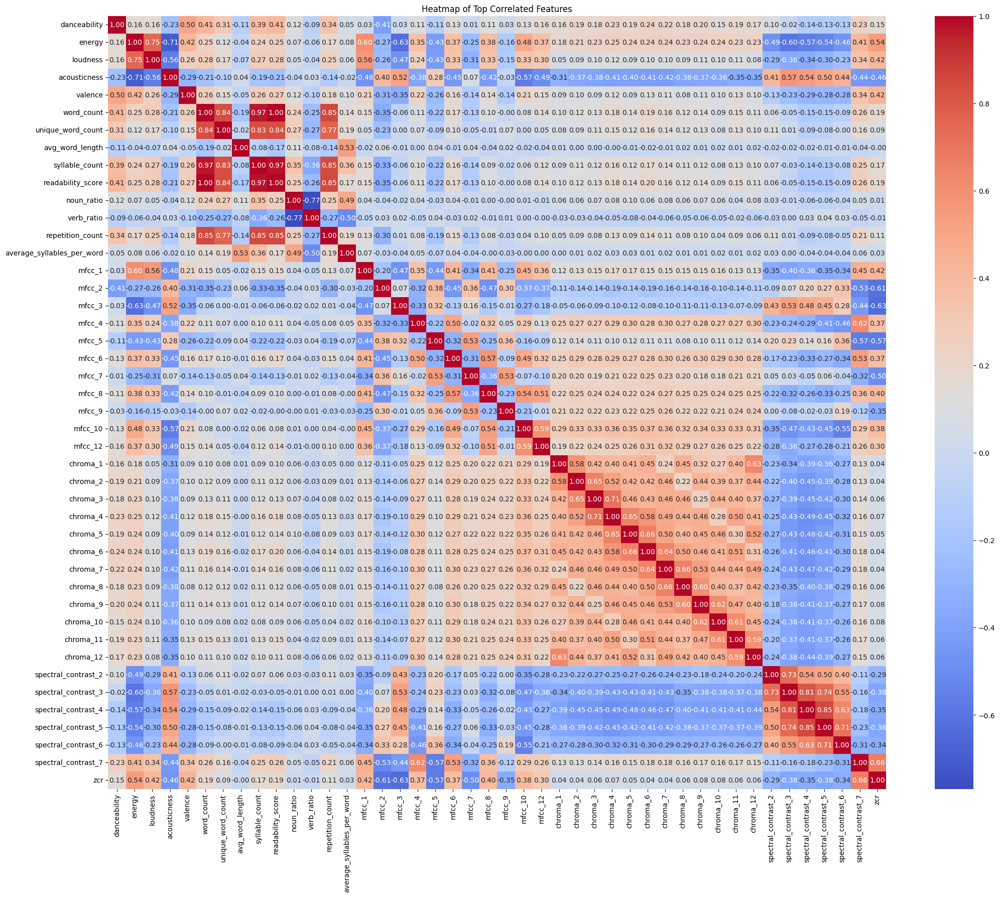

In [217]:
num_df = df[spotify_features + lyrics_features + audio_extracted_features].select_dtypes(include=[np.number]).dropna()

corr_matrix = num_df.corr()

high_corr_features = corr_matrix[corr_matrix.abs() > 0.5].stack().reset_index()
high_corr_features = high_corr_features[high_corr_features['level_0'] != high_corr_features['level_1']]

top_corr_features = pd.unique(high_corr_features[['level_0', 'level_1']].values.ravel('K'))

plt.figure(figsize=(25, 20))
sns.heatmap(num_df[top_corr_features].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap of Top Correlated Features', fontsize=12)
plt.show()


## 2. Hierarchical Clustering (Dendrogram)
Purpose:
Hierarchical clustering groups similar features based on their pairwise correlations, visualized using a dendrogram. This technique helps in clustering features into groups that are highly correlated, reducing dimensionality or simplifying feature analysis.

How It Works:

The dendrogram is built using agglomerative clustering, where each feature starts in its own cluster, and the most similar clusters are merged at each step. This continues until all features are grouped into a single cluster.
The Ward linkage method was used, which minimizes the variance within clusters.
The vertical axis represents the distance (or dissimilarity) between clusters. The longer the vertical lines between two clusters, the more dissimilar they are.
Conclusion:
Hierarchical clustering allowed you to identify clusters of features that are strongly correlated. You can decide to keep one feature from each cluster to avoid redundancy. For example, acousticness and instrumentalness might fall into the same cluster due to their similarity.

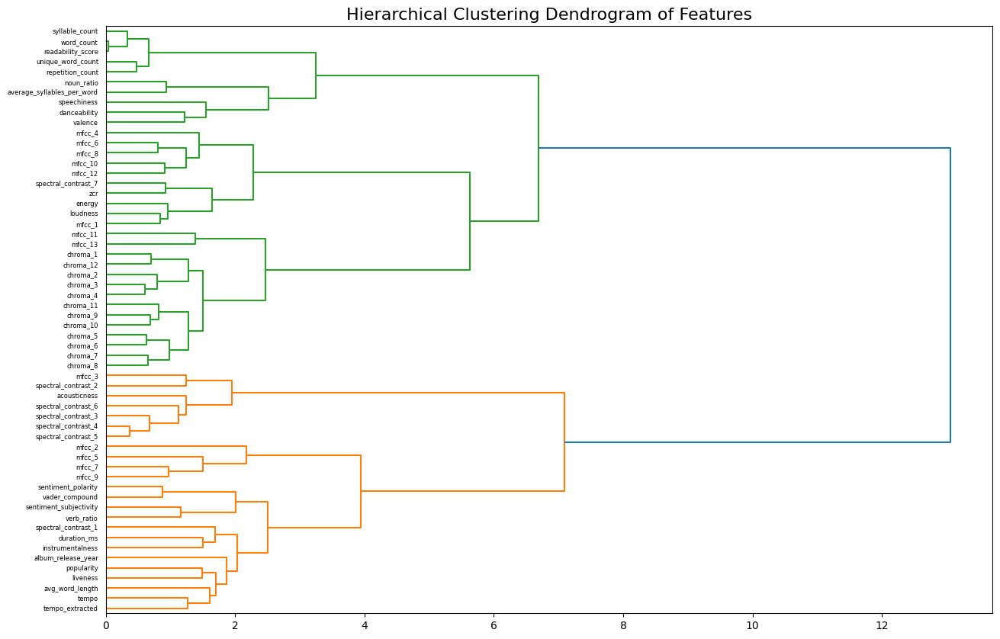

In [218]:
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt

corr_matrix = num_df.corr()

linked = linkage(corr_matrix, 'ward')

plt.figure(figsize=(15, 10))
dendrogram(linked, labels=corr_matrix.columns, orientation='right', distance_sort='descending')
plt.title('Hierarchical Clustering Dendrogram of Features', fontsize=16)
plt.show()

## 3. Pairplot for Highly Correlated Features
Purpose:
The pairplot is used to visualize the relationships between pairs of highly correlated features, enabling you to see patterns or potential relationships.

How It Works:

After identifying features with a high correlation (above 0.7 in your case), the pairplot generates scatter plots for each pair of features.
It also shows the distribution of each feature along the diagonal of the plot.
This technique highlights relationships that might not be immediately obvious in raw numerical data.
Conclusion:
The pairplot allows you to confirm whether highly correlated features exhibit a strong linear relationship or if they follow a more complex pattern. For example, features like energy and loudness might show a positive linear relationship in the pairplot.

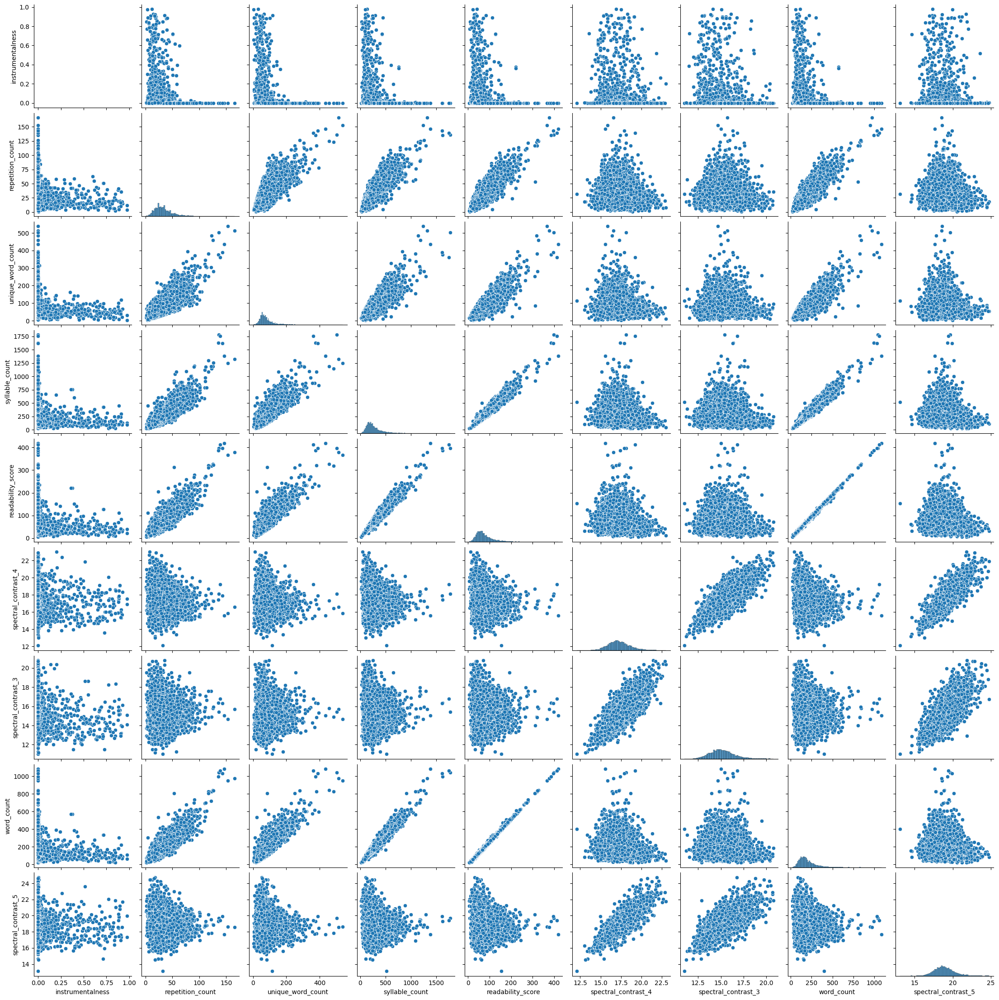

In [219]:
corr_matrix = num_df.corr().abs()
high_corr_var = corr_matrix.unstack().sort_values(kind="quicksort", ascending=False).drop_duplicates()
high_corr_var = high_corr_var[high_corr_var > 0.8]

top_corr_pairs = high_corr_var.index.tolist()
top_features = list(set([feature for pair in top_corr_pairs for feature in pair]))

sns.pairplot(num_df[top_features])
plt.show()

## 5. Network Graph of Highly Correlated Features
Purpose:
This method visualizes the relationships between highly correlated features as a network graph. It helps in understanding how features are interconnected.

How It Works:

You constructed a graph where each node represents a feature, and edges between nodes represent strong correlations (above a threshold, e.g., 0.7).
The spring layout was used to visualize the network, where highly connected nodes are pulled together, and less connected nodes are pushed apart.
Conclusion:
The network graph gives a visual summary of how features relate to each other, with clusters of nodes indicating groups of correlated features. This helps identify which features tend to co-occur in specific types of songs, such as danceability and energy forming one group, and acousticness and instrumentalness forming another.

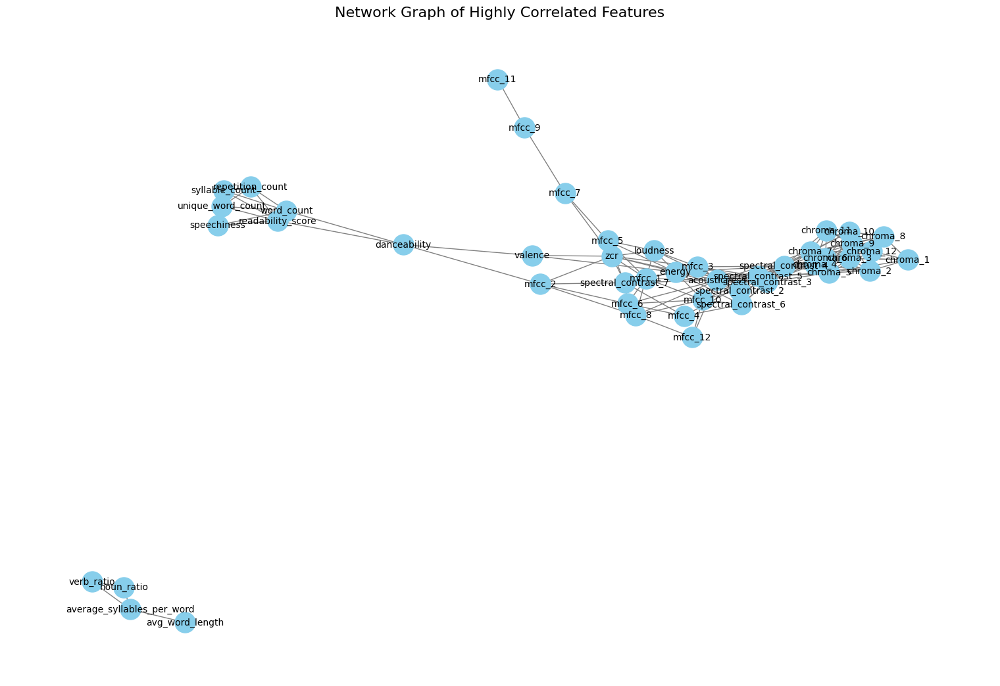

In [220]:
import networkx as nx

corr_matrix = num_df.corr().abs()
high_corr_pairs = corr_matrix.unstack().reset_index()
high_corr_pairs.columns = ['Feature1', 'Feature2', 'Correlation']
high_corr_pairs = high_corr_pairs[(high_corr_pairs['Correlation'] > 0.4) & (high_corr_pairs['Feature1'] != high_corr_pairs['Feature2'])]

G = nx.from_pandas_edgelist(high_corr_pairs, 'Feature1', 'Feature2', edge_attr='Correlation')

plt.figure(figsize=(15, 10))
pos = nx.spring_layout(G, k=0.15)
nx.draw(G, pos, with_labels=True, node_size=500, node_color='skyblue', edge_color='gray', font_size=10)
plt.title('Network Graph of Highly Correlated Features', fontsize=16)
plt.show()


## 6. t-SNE (t-Distributed Stochastic Neighbor Embedding)
Purpose:
t-SNE is used to visualize high-dimensional data in a 2D or 3D space while preserving local structure (similarities between points). It is particularly useful for visualizing clusters in data.

How It Works:

t-SNE reduces the dimensionality of data by modeling pairwise similarities between points in high-dimensional space and attempts to preserve these similarities in the low-dimensional projection.
t-SNE uses a probability distribution to calculate the similarity between points, with closer points in the original space being more likely to remain close in the reduced space.
It is useful for visualizing non-linear relationships in data, unlike PCA, which focuses on linear variance.
Conclusion:
In your t-SNE plot, you likely saw clusters of points corresponding to groups of songs that are similar in terms of their features. Well-separated clusters suggest that the songs in different groups are quite distinct in terms of musical characteristics or lyrics.



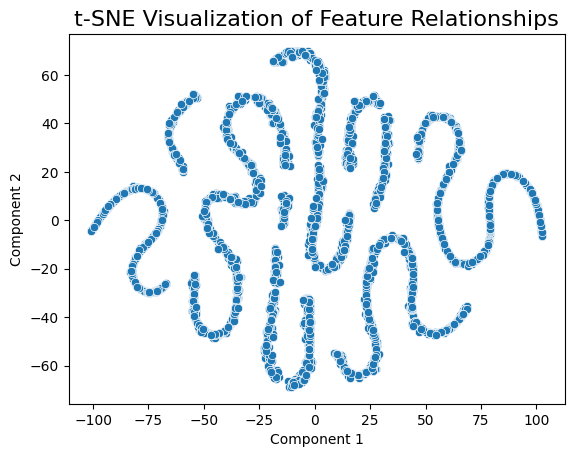

In [221]:
from sklearn.manifold import TSNE
import seaborn as sns

tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(num_df)

tsne_df = pd.DataFrame(tsne_result, columns=['Component 1', 'Component 2'])
sns.scatterplot(x='Component 1', y='Component 2', data=tsne_df)
plt.title('t-SNE Visualization of Feature Relationships', fontsize=16)
plt.show()

## 7. K-Means Clustering
Purpose:
K-Means clustering groups data into a specified number of clusters based on feature similarity. It aims to partition the dataset into K distinct groups where each point belongs to the cluster with the nearest mean.

How It Works:

You automatically determined the number of clusters (K) using the silhouette score, which measures how well-separated the clusters are. The optimal K maximizes the silhouette score.
The algorithm iterates by assigning points to clusters based on proximity to the current cluster centroids, and then recalculates the centroids until convergence.
Results/Conclusion:

4 Clusters were identified based on the silhouette score, and these clusters represent distinct groups of songs based on their features.
The cluster means table you generated provides insights into the characteristics of each group. For example, Cluster 3 had longer songs from earlier album release years with more syllables, suggesting a distinct style compared to more modern, shorter songs in Cluster 1.

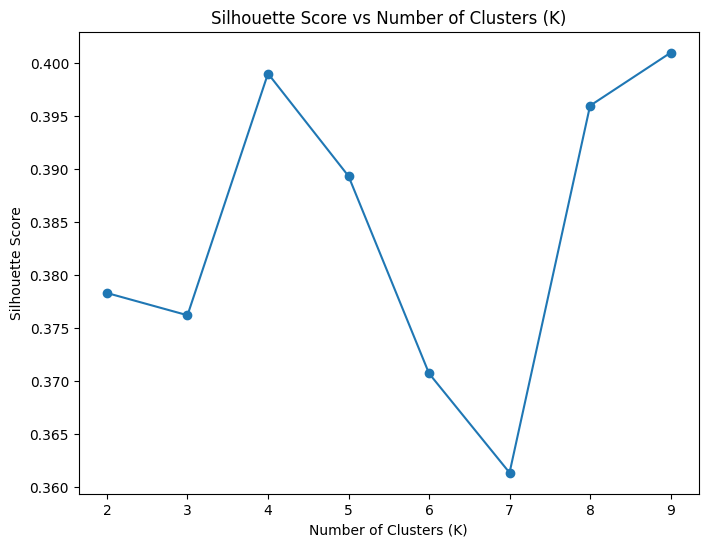

Optimal number of clusters: 9


9

In [222]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

def find_optimal_k(data, max_k=10):
    silhouette_scores = []
    for k in range(2, max_k):
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(data)
        score = silhouette_score(data, labels)
        silhouette_scores.append(score)

    plt.figure(figsize=(8, 6))
    plt.plot(range(2, max_k), silhouette_scores, marker='o')
    plt.title('Silhouette Score vs Number of Clusters (K)')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.show()

    optimal_k = range(2, max_k)[silhouette_scores.index(max(silhouette_scores))]
    print(f'Optimal number of clusters: {optimal_k}')
    return optimal_k

optimal_k = find_optimal_k(tsne_result, max_k=10)
optimal_k

Cluster Means:


,popularity,album_release_year,duration_ms,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,...,chroma_12,spectral_contrast_1,spectral_contrast_2,spectral_contrast_3,spectral_contrast_4,spectral_contrast_5,spectral_contrast_6,spectral_contrast_7,tempo_extracted,zcr
cluster,,,,,,,,,,,,,,,,,,,,,
0,59.486137,2011.408503,143961.833641,0.657375,0.582909,-7.846327,0.105733,0.348949,0.033694,0.177829,...,0.441317,15.485929,11.724293,15.429955,17.390115,19.057430,18.422876,53.668091,125.362144,0.051308
1,57.840787,2007.155635,268385.533095,0.574880,0.612733,-7.590395,0.063019,0.256115,0.033017,0.162637,...,0.458060,15.486285,11.122923,15.042597,17.298873,18.847075,18.114780,53.807630,123.689481,0.050984
2,59.046990,2011.612335,225142.496329,0.601896,0.631055,-6.899145,0.071840,0.274199,0.019052,0.174861,...,0.444787,15.366950,11.238691,15.163184,17.300761,18.932610,18.142853,53.796830,123.275998,0.051301
3,58.669944,2013.382022,185346.441011,0.630202,0.644071,-6.658750,0.086266,0.270476,0.014895,0.181276,...,0.450519,15.306474,11.336731,15.091355,17.128416,18.722730,17.951436,53.937757,122.860250,0.051896
4,58.869210,2012.453678,189376.822888,0.623290,0.644034,-6.673755,0.078257,0.252857,0.012374,0.175430,...,0.450164,15.329490,11.353500,15.134825,17.242263,18.808730,18.077699,53.860422,123.740317,0.052069
5,58.677675,2011.517834,228957.180978,0.602139,0.648144,-6.658590,0.069341,0.241101,0.018141,0.165115,...,0.451230,15.416040,11.200841,15.069591,17.297628,18.855964,18.110889,54.056575,122.651013,0.053511
6,59.711214,2012.688172,209975.764977,0.619315,0.654396,-6.432029,0.071840,0.236049,0.015042,0.164007,...,0.447727,15.401882,11.293875,15.129726,17.228133,18.871494,18.102241,54.019936,122.547493,0.051821
7,59.745223,2010.783439,242668.869427,0.597369,0.637947,-6.769787,0.073986,0.243713,0.022319,0.176894,...,0.447573,15.424810,11.226717,15.161343,17.319884,18.895248,18.055000,54.042720,124.616516,0.052053
8,57.420800,2005.420800,323274.451200,0.557778,0.595232,-8.204896,0.065874,0.270882,0.043811,0.179990,...,0.457885,15.636076,11.150993,15.073335,17.320304,18.901868,18.167624,53.820404,124.507155,0.051462



Cluster 0 dominant features:
duration_ms           143961.833641
album_release_year      2011.408503
syllable_count           242.541590
Name: 0, dtype: float64

Cluster 1 dominant features:
duration_ms           268385.533095
album_release_year      2007.155635
syllable_count           264.481216
Name: 1, dtype: float64

Cluster 2 dominant features:
duration_ms           225142.496329
album_release_year      2011.612335
syllable_count           267.522761
Name: 2, dtype: float64

Cluster 3 dominant features:
duration_ms           185346.441011
album_release_year      2013.382022
syllable_count           262.820225
Name: 3, dtype: float64

Cluster 4 dominant features:
duration_ms           189376.822888
album_release_year      2012.453678
syllable_count           255.399183
Name: 4, dtype: float64

Cluster 5 dominant features:
duration_ms           228957.180978
album_release_year      2011.517834
syllable_count           271.107001
Name: 5, dtype: float64

Cluster 6 dominant features

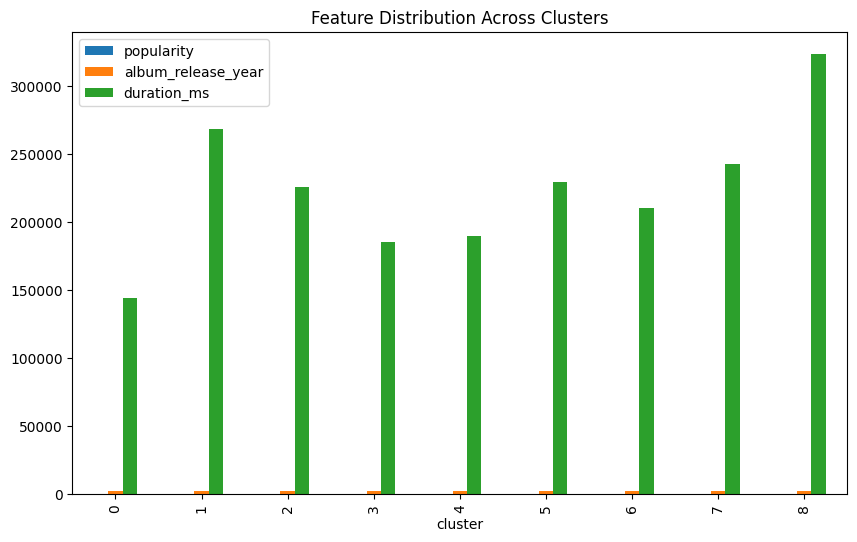

In [226]:
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans_labels = kmeans.fit_predict(tsne_result)

num_df['cluster'] = kmeans_labels

cluster_means = num_df.groupby('cluster').mean()

print("Cluster Means:")
display(cluster_means)

def identify_cluster_features(cluster_means, n_features=3):
    for cluster in cluster_means.index:
        sorted_features = cluster_means.loc[cluster].sort_values(ascending=False)
        print(f'\nCluster {cluster} dominant features:')
        print(sorted_features.head(n_features))

identify_cluster_features(cluster_means)

selected_features = cluster_means.columns[:3]  # Adjust based on the most important features you want to visualize
cluster_means[selected_features].plot(kind='bar', figsize=(10, 6))
plt.title('Feature Distribution Across Clusters')
plt.show()

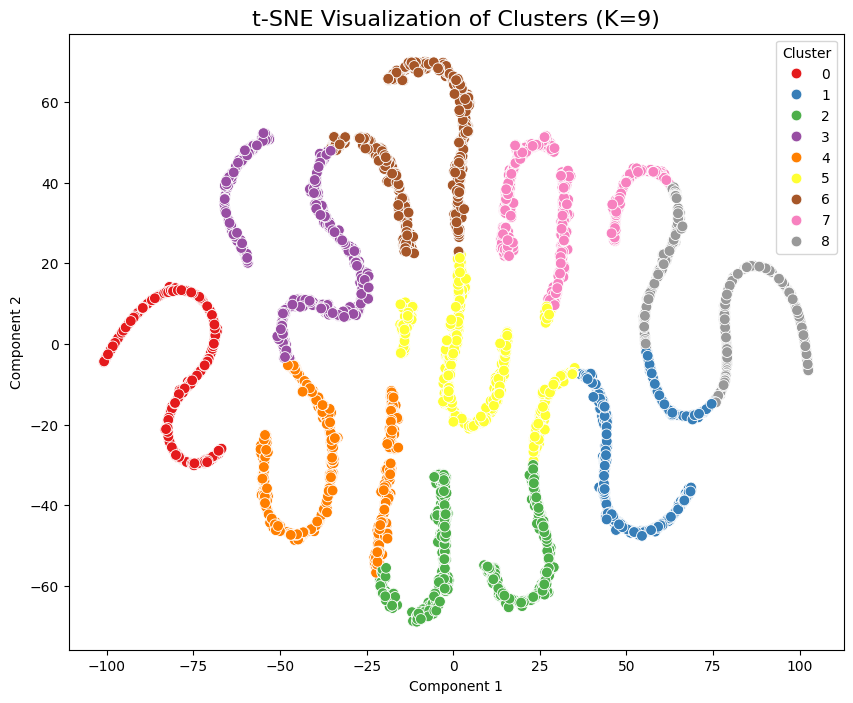

In [224]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 8))

sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], hue=kmeans_labels, palette='Set1', s=60, legend='full')

plt.title(f't-SNE Visualization of Clusters (K={optimal_k})', fontsize=16)
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.legend(title='Cluster')

plt.show()


1. Optimal Number of Clusters:
You determined 4 clusters using the silhouette score, which suggests that the data is naturally grouped into 4 main clusters.
The fact that the silhouette score gave a clear optimal K (4) indicates that the dataset has distinct groupings that can be meaningfully separated.
2. Cluster Characteristics:
From the mean feature values per cluster, several interesting patterns emerge:
Cluster 3 stands out due to its significantly higher duration_ms (average song length) and an earlier album release year (around 2007). This suggests that this cluster might contain older songs with longer durations.
Cluster 1, on the other hand, has the shortest duration_ms and the most recent album release year (around 2013), indicating it might represent more modern, shorter songs.
Syllable Count also varies across clusters, with Cluster 3 having the highest syllable count, which could indicate that the lyrics in this group are more complex or verbose.
3. Audio Features:
In terms of acousticness and instrumentalness:
Cluster 3 has the highest values for both, which suggests that this group could consist of more instrumental and acoustic songs compared to the others.
Cluster 1 has the lowest acousticness and instrumentalness, implying a focus on more electronic or produced tracks with fewer acoustic elements.
Energy is quite consistent across clusters, although Cluster 2 shows a slight increase. This could imply that this group contains more energetic tracks.
4. Sentiment Analysis:
The sentiment polarity and vader_compound values across clusters do not vary significantly, suggesting that the general tone or sentiment of the lyrics may be somewhat similar across different clusters. However, Cluster 3 shows a slightly more positive sentiment, both in terms of polarity and subjectivity, which could indicate more emotionally charged or subjective lyrical content.
Readability score: Interestingly, Cluster 1 has the lowest readability score, indicating that the lyrics in this group might be simpler or easier to understand, possibly reflecting trends in modern popular music where lyrics are often more straightforward.
5. Lyrical Complexity:
Average syllables per word and repetition count also show variations across clusters:
Cluster 3 again stands out with the highest repetition count and syllable complexity, potentially indicating songs that are more lyrically dense and repetitive, which might align with certain genres (e.g., ballads or older pop songs).
Cluster 1 has lower values in both categories, suggesting simpler, less repetitive lyrics, possibly aligning with modern pop music.
6. Insights from t-SNE Visualization:
The t-SNE visualization of the clusters shows how well-separated or overlapping the clusters are in the reduced dimensional space. Depending on how distinct the clusters appear in the 2D plot, you can assess how well the clustering algorithm performed.
If the clusters are well-separated in the t-SNE plot, it reinforces the idea that the 4 clusters are meaningful and capture significant differences in the dataset.
If there’s significant overlap, it may suggest that there’s a continuum or overlap in musical or lyrical features across different songs, which is common in music genres that blend elements from various influences.
Potential Interesting Observations:
Cluster 3 is particularly interesting because it represents older, longer songs with higher instrumentalness and acousticness, as well as more complex and repetitive lyrics. This could suggest that this group contains tracks from more traditional genres or older music styles.
Cluster 1, representing newer, shorter songs with simpler lyrics and lower instrumentalness, seems to capture the essence of modern pop music, where songs are often shorter and more focused on electronic production rather than acoustic or instrumental elements.
The relatively consistent energy across clusters suggests that this might not be the most defining feature in distinguishing the songs, but the variations in acousticness, instrumentalness, and lyrical complexity provide more insight into what differentiates the clusters.
Repetition and syllable count highlight differences in lyrical styles, with certain clusters (like Cluster 3) having more complex, verbose lyrics and others (like Cluster 1) leaning towards simpler, more repetitive content.


7. Suggestions for Further Exploration:
Genre Analysis: If you have genre information, mapping the clusters to genres might reveal interesting trends in how different musical genres cluster based on acoustic and lyrical features.
Popularity vs Features: Explore how popularity correlates with different clusters and features. For example, are modern, simpler songs (Cluster 1) more popular than older, more complex songs (Cluster 3)?
Deeper Sentiment Analysis: The sentiment analysis could be expanded to explore how emotional tone (positive/negative) correlates with acoustic features like valence or loudness.

In [227]:
df['cluster'] = num_df['cluster'].copy()

In [228]:
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, homogeneity_completeness_v_measure

# Compute metrics
nmi = normalized_mutual_info_score(df['genre'], df['cluster'])
ari = adjusted_rand_score(df['genre'], df['cluster'])
homogeneity, completeness, v_measure = homogeneity_completeness_v_measure(df['genre'], df['cluster'])

# Print the results
print(f"Normalized Mutual Information (NMI): {nmi:.3f}")
print(f"Adjusted Rand Index (ARI): {ari:.3f}")
print(f"Homogeneity: {homogeneity:.3f}")
print(f"Completeness: {completeness:.3f}")
print(f"V-Measure: {v_measure:.3f}")

Normalized Mutual Information (NMI): 0.019
Adjusted Rand Index (ARI): 0.008
Homogeneity: 0.020
Completeness: 0.018
V-Measure: 0.019


In [229]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table, annot=True, fmt="d", cmap="Blues")
plt.title("Contingency Table of Genres and Clusters")
plt.ylabel("Genres")
plt.xlabel("Clusters")
plt.show()


NameError: name 'contingency_table' is not defined

<Figure size 1000x600 with 0 Axes>

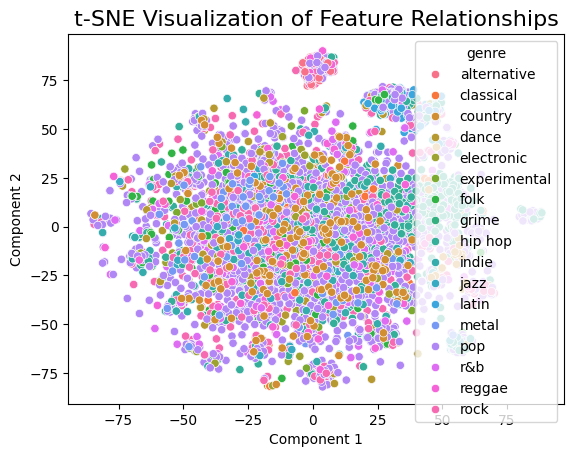

In [247]:
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.preprocessing import StandardScaler

num_df = df[spotify_features + lyrics_features + audio_extracted_features + tfidf_features].select_dtypes(include=[np.number]).dropna()

scaler = StandardScaler()
scaled_features = scaler.fit_transform(num_df[[c for c in lyrics_features + tfidf_features if c in num_df]])

tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(scaled_features)

tsne_df = pd.DataFrame(tsne_result, columns=['Component 1', 'Component 2'])

sns.scatterplot(x='Component 1', y='Component 2', data=pd.concat([tsne_df, df[['genre']]], axis=1), legend='full', hue='genre')
plt.title('t-SNE Visualization of Feature Relationships', fontsize=16)
plt.show()

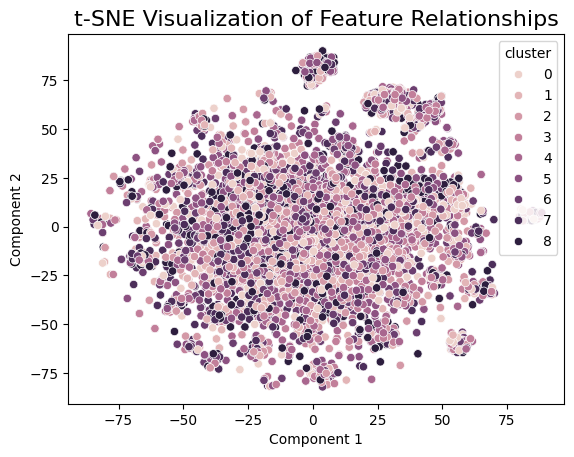

In [252]:
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.preprocessing import StandardScaler

num_df = df[spotify_features + lyrics_features + audio_extracted_features + tfidf_features].select_dtypes(include=[np.number]).dropna()

scaler = StandardScaler()
scaled_features = scaler.fit_transform(num_df[[c for c in lyrics_features + tfidf_features if c in num_df]])

tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(scaled_features)

tsne_df = pd.DataFrame(tsne_result, columns=['Component 1', 'Component 2'])

sns.scatterplot(x='Component 1', y='Component 2', data=pd.concat([tsne_df, df[['cluster']]], axis=1), legend='full', hue='cluster')
plt.title('t-SNE Visualization of Feature Relationships', fontsize=16)
plt.show()

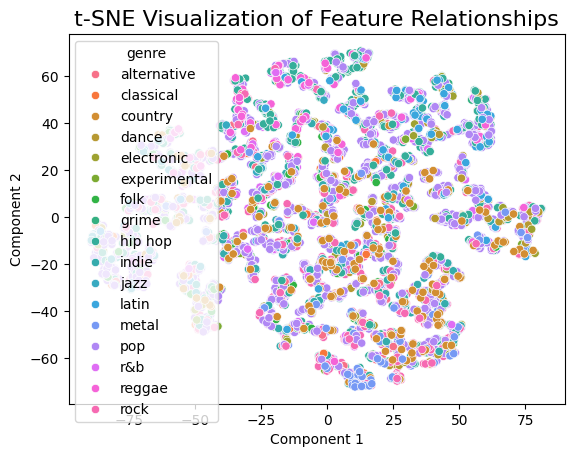

In [236]:
from sklearn.manifold import TSNE
import seaborn as sns

tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(num_df[[c for c in acoustic_features if c in num_df]])

tsne_df = pd.DataFrame(tsne_result, columns=['Component 1', 'Component 2'])
sns.scatterplot(x='Component 1', y='Component 2', data=pd.concat([tsne_df, df[['genre']]], axis=1), legend='full', hue='genre')
plt.title('t-SNE Visualization of Feature Relationships', fontsize=16)
plt.show()

In [ ]:
from sklearn.manifold import TSNE
import seaborn as sns

tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(num_df[[c for c in acoustic_features if c in num_df]], legend='full', hue='genre')

tsne_df = pd.DataFrame(tsne_result, columns=['Component 1', 'Component 2'])
sns.scatterplot(x='Component 1', y='Component 2', data=tsne_df)
plt.title('t-SNE Visualization of Feature Relationships', fontsize=16)
plt.show()

# Mean song popualrity per genre

<Axes: xlabel='genre'>

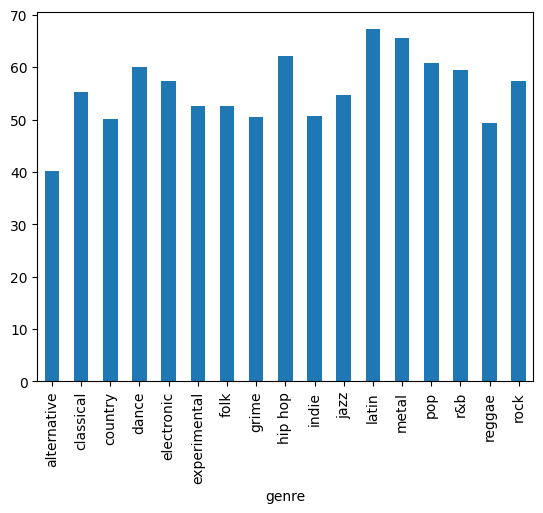

In [254]:
df.groupby("genre").popularity.mean().plot(kind='bar')

# Percent of explicit songs per year

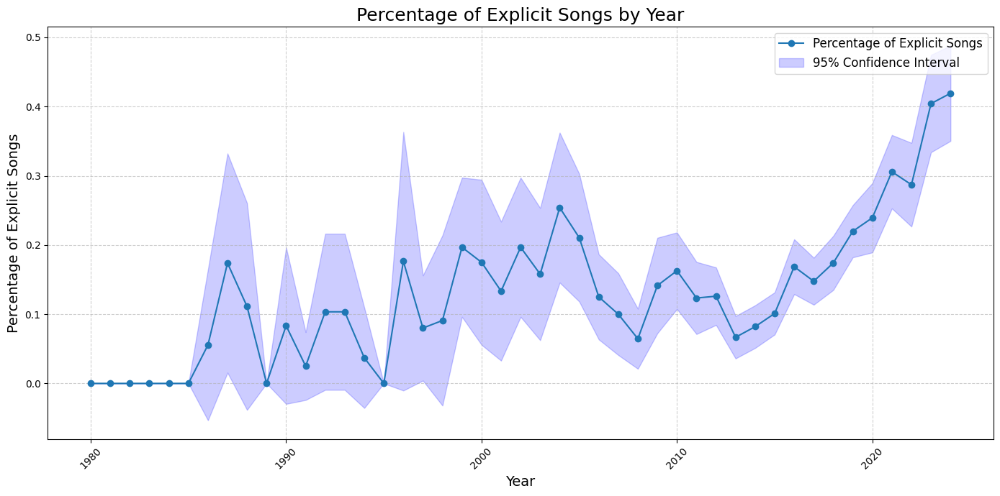

In [271]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Ensure that tmp.explicit is numeric (0 or 1)
tmp = df[['explicit', 'album_release_year']].copy()
tmp['explicit'] = tmp['explicit'].astype(int)

# Group data by year and calculate the mean, sample size, and standard deviation
summary = (
    tmp.groupby('album_release_year')['explicit']
    .agg(['mean', 'count', 'std'])
    .reset_index()
    .rename(columns={'mean': 'percentage_explicit', 'count': 'sample_size', 'std': 'std_dev'})
)

# Calculate confidence intervals (assuming a normal distribution)
summary['ci'] = 1.96 * (summary['std_dev'] / np.sqrt(summary['sample_size']))

# Filter years to start from 1980
summary = summary[summary['album_release_year'] >= 1980]

# Plotting the lineplot with confidence intervals
plt.figure(figsize=(14, 7))
plt.plot(
    summary['album_release_year'], 
    summary['percentage_explicit'], 
    marker='o', 
    label='Percentage of Explicit Songs'
)

# Add shaded confidence intervals
plt.fill_between(
    summary['album_release_year'], 
    summary['percentage_explicit'] - summary['ci'], 
    summary['percentage_explicit'] + summary['ci'], 
    color='blue', 
    alpha=0.2, 
    label='95% Confidence Interval'
)

# Add titles and labels
plt.title('Percentage of Explicit Songs by Year', fontsize=18)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Percentage of Explicit Songs', fontsize=14)

# Customize ticks and grid
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(visible=True, linestyle='--', alpha=0.6)

# Add legend
plt.legend(fontsize=12)

# Improve layout
plt.tight_layout()
plt.show()


# Popularity vs. explicit content

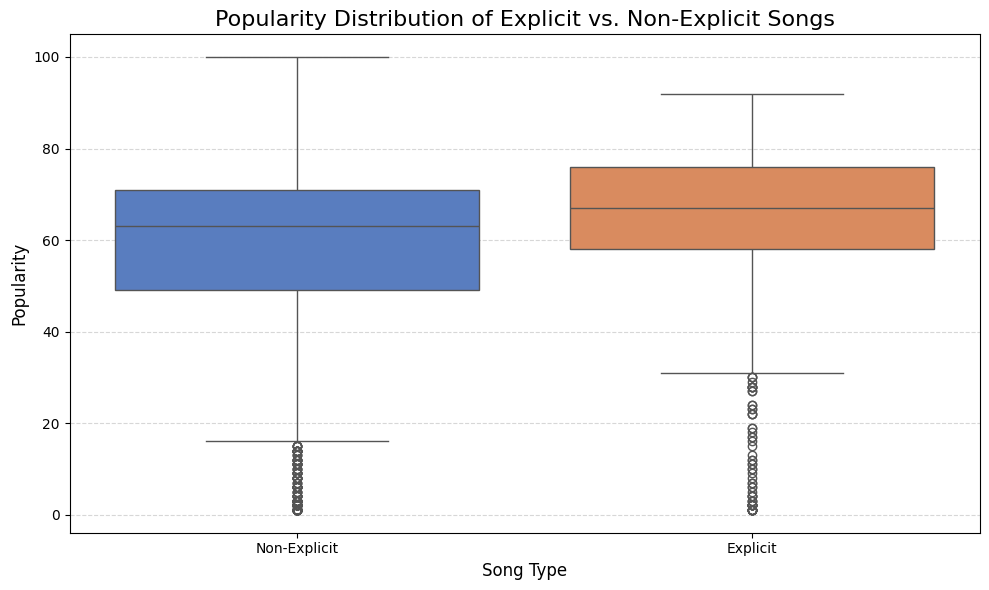

In [272]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

tmp_df = df.copy()
# Ensure explicit is numeric
tmp_df['explicit'] = tmp_df['explicit'].astype(int)

# Prepare data for visualization
explicit_vs_popularity = tmp_df[['explicit', 'popularity']].copy()
explicit_vs_popularity['explicit_label'] = explicit_vs_popularity['explicit'].map({0: 'Non-Explicit', 1: 'Explicit'})

# Plot a boxplot to compare popularity distribution
plt.figure(figsize=(10, 6))
sns.boxplot(
    x='explicit_label', 
    y='popularity', 
    data=explicit_vs_popularity, 
    palette='muted'
)

# Add titles and labels
plt.title('Popularity Distribution of Explicit vs. Non-Explicit Songs', fontsize=16)
plt.xlabel('Song Type', fontsize=12)
plt.ylabel('Popularity', fontsize=12)

# Show the plot
plt.tight_layout()
plt.grid(visible=True, linestyle='--', alpha=0.5, axis='y')
plt.show()


In [273]:
from scipy.stats import ttest_ind, mannwhitneyu
import numpy as np

tmp_df = tmp_df.copy()
# Optional: Winsorize or remove outliers
def winsorize_series(series, lower_percentile=0.05, upper_percentile=0.95):
    lower_limit = np.percentile(series, lower_percentile * 100)
    upper_limit = np.percentile(series, upper_percentile * 100)
    return np.clip(series, lower_limit, upper_limit)

# Winsorize popularity to handle outliers
tmp_df['popularity_winsorized'] = winsorize_series(tmp_df['popularity'])

# Separate explicit and non-explicit groups
explicit_popularity = tmp_df.loc[tmp_df['explicit'] == 1, 'popularity_winsorized']
non_explicit_popularity = tmp_df.loc[tmp_df['explicit'] == 0, 'popularity_winsorized']

# Perform t-test
t_stat, t_pval = ttest_ind(explicit_popularity, non_explicit_popularity, equal_var=False)

# Perform Mann-Whitney U test
u_stat, u_pval = mannwhitneyu(explicit_popularity, non_explicit_popularity, alternative='two-sided')

# Print results
print(f"T-Test Results: t-statistic = {t_stat:.3f}, p-value = {t_pval:.3e}")
print(f"Mann-Whitney U Test Results: U-statistic = {u_stat:.3f}, p-value = {u_pval:.3e}")

T-Test Results: t-statistic = 9.575, p-value = 4.348e-21
Mann-Whitney U Test Results: U-statistic = 2891532.500, p-value = 1.111e-25


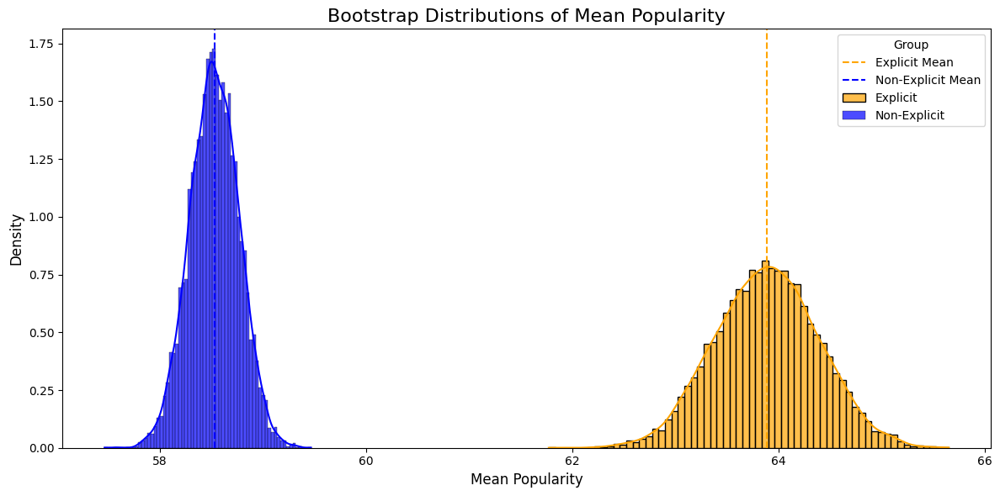

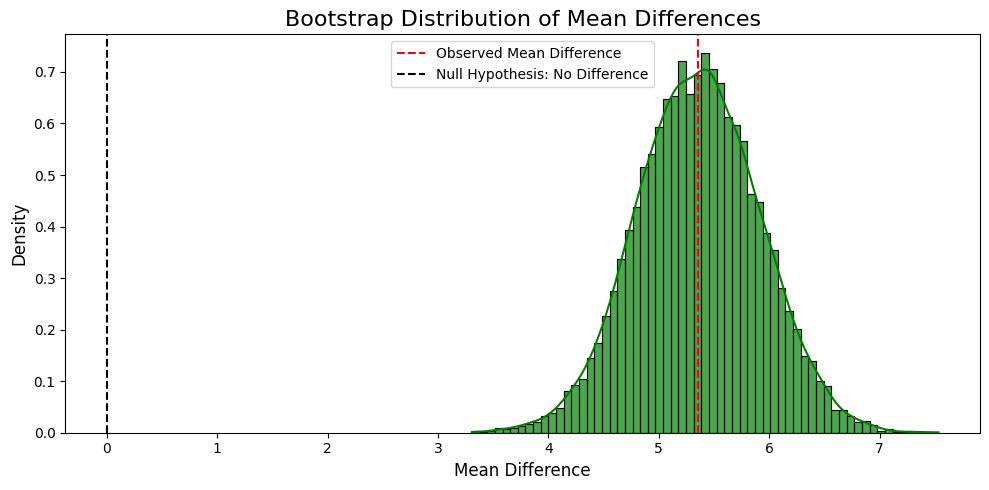

,Group,Mean,95% CI Lower,95% CI Upper,Bootstrap p-value
0,Explicit,63.886598,62.923686,64.855696,NaN
1,Non-Explicit,58.530500,58.066053,58.990860,NaN
2,Difference,5.356098,4.272537,6.441060,0.0


In [294]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Prepare data
explicit_popularity = tmp_df[tmp_df["explicit"] == 1]["popularity_winsorized"]
non_explicit_popularity = tmp_df[tmp_df["explicit"] == 0]["popularity_winsorized"]

# Bootstrap function
def bootstrap_means(data, n_resamples=10000):
    return np.array([np.mean(np.random.choice(data, size=len(data), replace=True)) for _ in range(n_resamples)])

# Bootstrap sampling
n_resamples = 10000
explicit_bootstrap_means = bootstrap_means(explicit_popularity, n_resamples=n_resamples)
non_explicit_bootstrap_means = bootstrap_means(non_explicit_popularity, n_resamples=n_resamples)

# Calculate the observed mean difference
observed_diff = explicit_popularity.mean() - non_explicit_popularity.mean()

# Calculate p-value from bootstrap
bootstrap_diff_means = explicit_bootstrap_means - non_explicit_bootstrap_means
p_value = np.mean(bootstrap_diff_means <= 0)

# Confidence intervals
explicit_ci = np.percentile(explicit_bootstrap_means, [2.5, 97.5])
non_explicit_ci = np.percentile(non_explicit_bootstrap_means, [2.5, 97.5])
diff_ci = np.percentile(bootstrap_diff_means, [2.5, 97.5])

# Tabular results
results_table = pd.DataFrame({
    "Group": ["Explicit", "Non-Explicit", "Difference"],
    "Mean": [explicit_popularity.mean(), non_explicit_popularity.mean(), observed_diff],
    "95% CI Lower": [explicit_ci[0], non_explicit_ci[0], diff_ci[0]],
    "95% CI Upper": [explicit_ci[1], non_explicit_ci[1], diff_ci[1]],
    "Bootstrap p-value": [np.nan, np.nan, p_value]
})

# Plot bootstrap distributions
plt.figure(figsize=(12, 6))
sns.histplot(explicit_bootstrap_means, color="orange", kde=True, label="Explicit", stat="density", alpha=0.7)
sns.histplot(non_explicit_bootstrap_means, color="blue", kde=True, label="Non-Explicit", stat="density", alpha=0.7)
plt.axvline(x=explicit_popularity.mean(), color="orange", linestyle="--", label="Explicit Mean")
plt.axvline(x=non_explicit_popularity.mean(), color="blue", linestyle="--", label="Non-Explicit Mean")
plt.title("Bootstrap Distributions of Mean Popularity", fontsize=16)
plt.xlabel("Mean Popularity", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.legend(title="Group")
plt.tight_layout()
plt.show()

# Plot bootstrap mean difference distribution
plt.figure(figsize=(10, 5))
sns.histplot(bootstrap_diff_means, color="green", kde=True, stat="density", alpha=0.7)
plt.axvline(x=observed_diff, color="red", linestyle="--", label="Observed Mean Difference")
plt.axvline(x=0, color="black", linestyle="--", label="Null Hypothesis: No Difference")
plt.title("Bootstrap Distribution of Mean Differences", fontsize=16)
plt.xlabel("Mean Difference", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()

results_table

# Popularity vs explicit content

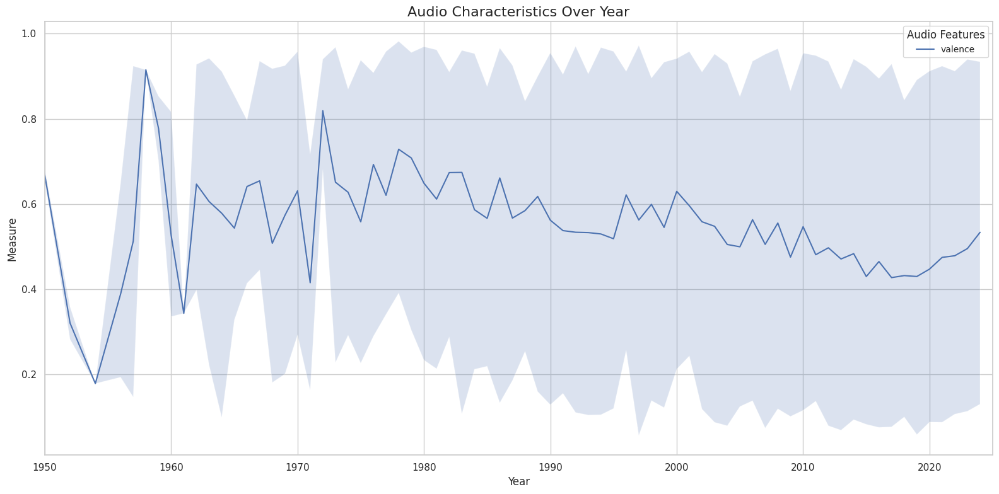

In [321]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Prepare figure
plt.figure(figsize=(16, 8))
sns.set(style="whitegrid")

# Define columns and calculate mean with confidence intervals
# columns = ["acousticness", "danceability", "energy", "speechiness", "liveness", "valence"]
# columns = ['tempo']
# columns = ['speechiness']
columns = ['valence']
for col in columns:
    # Group data by year and calculate mean and confidence intervals
    grouped = df.groupby("album_release_year")[col].agg(
        mean="mean",
        ci_lower=lambda x: np.percentile(x, 2.5),  # Lower bound of 95% CI
        ci_upper=lambda x: np.percentile(x, 97.5)  # Upper bound of 95% CI
    ).reset_index()

    # Plot mean with confidence intervals
    sns.lineplot(
        x=grouped["album_release_year"],
        y=grouped["mean"],
        label=col,
    )
    plt.fill_between(
        grouped["album_release_year"],
        grouped["ci_lower"],
        grouped["ci_upper"],
        alpha=0.2
    )

# Set plot labels and limits
plt.title('Audio Characteristics Over Year', fontsize=16)
plt.ylabel('Measure', fontsize=12)
plt.xlabel('Year', fontsize=12)
plt.xlim([1950, 2025])
plt.legend(title="Audio Features", fontsize=10)
plt.tight_layout()
plt.show()


In [322]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kruskal, spearmanr

numerical_features = [col for col in df.columns if col != 'album_release_year' and df[col].dtype in ['float64', 'int64']]
years = df['album_release_year'].unique()
years.sort()

# Prepare a results DataFrame
trend_results = []

# Perform analysis for each numerical feature
for feature in numerical_features:
    # 1. Kruskal-Wallis Test
    grouped_data = [df.loc[df['album_release_year'] == year, feature].dropna() for year in years]
    stat, p_value = kruskal(*grouped_data)
    
    # 2. Spearman Correlation
    correlation, corr_p_value = spearmanr(df['album_release_year'], df[feature])

    # Store results
    trend_results.append({
        'Feature': feature,
        'Kruskal-Wallis p-value': p_value,
        'Spearman Correlation': correlation,
        'Spearman p-value': corr_p_value
    })

# Convert results to DataFrame
trend_results_df = pd.DataFrame(trend_results)

# Filter features with significant trends
significant_trends = trend_results_df[
    (trend_results_df['Kruskal-Wallis p-value'] < 0.05) | 
    (trend_results_df['Spearman p-value'] < 0.05)
]

significant_trends

,Feature,Kruskal-Wallis p-value,Spearman Correlation,Spearman p-value
0,popularity,8.243758e-27,-0.024320,6.203650e-02
1,duration_ms,2.337770e-137,-0.287381,2.428694e-112
2,danceability,7.464541e-24,0.098433,3.735344e-14
3,energy,3.311261e-70,-0.117065,2.025833e-19
4,loudness,5.072406e-113,0.065162,5.605392e-07
...,...,...,...,...
102,tfidf_45,1.325924e-04,0.018761,1.500284e-01
103,tfidf_46,5.955572e-06,-0.060709,3.135474e-06
104,tfidf_47,5.715993e-06,0.036493,5.101199e-03
105,tfidf_48,4.800661e-07,0.083630,1.300405e-10


In [328]:
significant_trends['spabs'] =  significant_trends['Spearman Correlation'].abs()

In [338]:
significant_trends.sort_values(by=['spabs'])[-20:]

,Feature,Kruskal-Wallis p-value,Spearman Correlation,Spearman p-value,spabs
41,spectral_contrast_6,7.351500e-37,0.132314,2.075511e-24,0.132314
81,tfidf_24,1.363726e-16,0.134202,4.530562e-25,0.134202
97,tfidf_40,8.708156e-18,-0.139663,4.908396e-27,0.139663
42,spectral_contrast_7,1.542631e-62,-0.146128,1.823132e-29,0.146128
68,tfidf_11,4.482150e-23,-0.147284,6.523789e-30,0.147284
5,speechiness,4.181809e-24,0.149594,8.156312e-31,0.149594
14,mfcc_4,1.195441e-59,-0.151616,1.286746e-31,0.151616
60,tfidf_3,5.201407e-26,-0.154090,1.295632e-32,0.154090
9,valence,3.629393e-45,-0.156402,1.465591e-33,0.156402
38,spectral_contrast_3,7.976179e-48,0.157048,7.922278e-34,0.157048


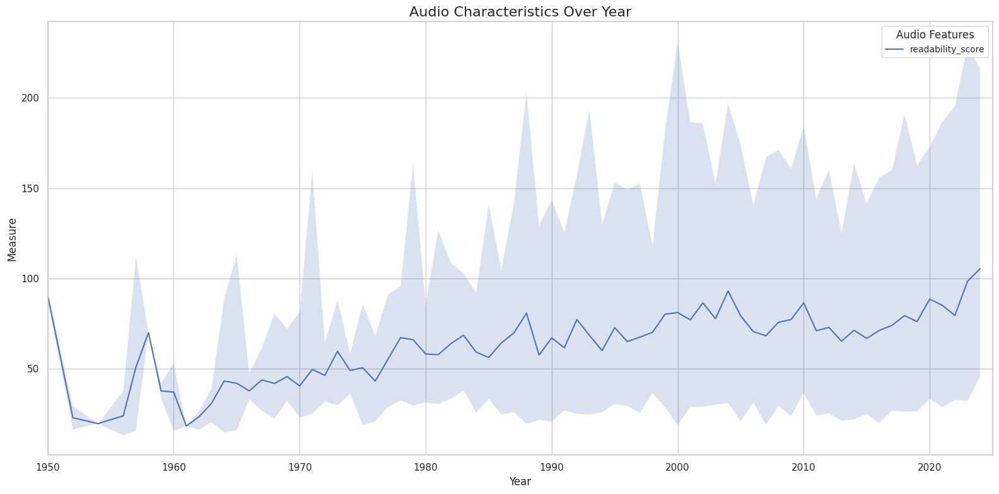

In [339]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Prepare figure
plt.figure(figsize=(16, 8))
sns.set(style="whitegrid")

# Define columns and calculate mean with confidence intervals
# columns = ["acousticness", "danceability", "energy", "speechiness", "liveness", "valence"]
# columns = ['tempo']
# columns = ['speechiness']
columns = ['readability_score']
for col in columns:
    # Group data by year and calculate mean and confidence intervals
    grouped = df.groupby("album_release_year")[col].agg(
        mean="mean",
        ci_lower=lambda x: np.percentile(x, 2.5),  # Lower bound of 95% CI
        ci_upper=lambda x: np.percentile(x, 97.5)  # Upper bound of 95% CI
    ).reset_index()

    # Plot mean with confidence intervals
    sns.lineplot(
        x=grouped["album_release_year"],
        y=grouped["mean"],
        label=col,
    )
    plt.fill_between(
        grouped["album_release_year"],
        grouped["ci_lower"],
        grouped["ci_upper"],
        alpha=0.2
    )

# Set plot labels and limits
plt.title('Audio Characteristics Over Year', fontsize=16)
plt.ylabel('Measure', fontsize=12)
plt.xlabel('Year', fontsize=12)
plt.xlim([1950, 2025])
plt.legend(title="Audio Features", fontsize=10)
plt.tight_layout()
plt.show()


# Viz

In [193]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Convert lyrics to TF-IDF
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
tfidf_matrix = tfidf_vectorizer.fit_transform(df['lyrics'])

# Dimensionality reduction with t-SNE
tsne = TSNE(n_components=2, random_state=0)
reduced_data = tsne.fit_transform(tfidf_matrix.toarray())

# Clustering with K-Means
kmeans = KMeans(n_clusters=18, random_state=0)
clusters = kmeans.fit_predict(reduced_data)

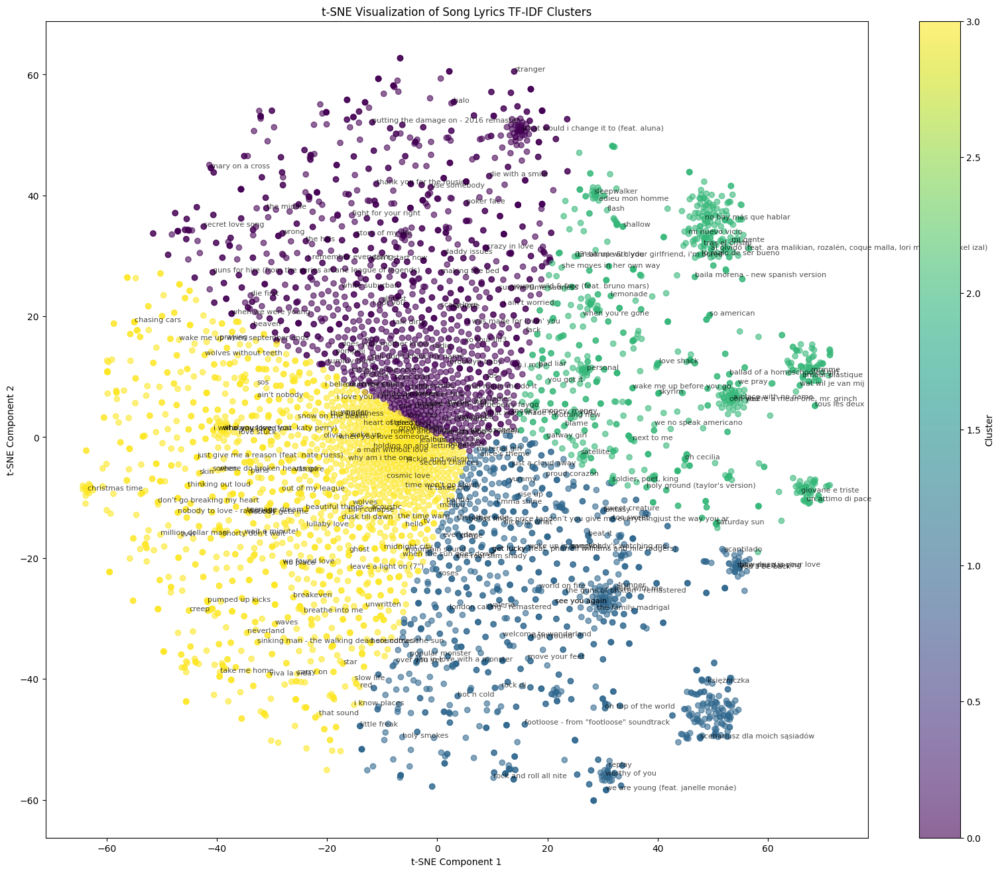

In [46]:
# Plotting with improved readability
plt.figure(figsize=(20, 16))
scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=clusters, cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Cluster')
plt.title('t-SNE Visualization of Song Lyrics TF-IDF Clusters')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')

# Annotate only some points to avoid clutter
for i, txt in enumerate(df['title']):
    # Annotate only one point per cluster center, or a subset of points
    if np.random.rand() < 0.05:  # Randomly annotate only 5% of the points
        plt.annotate(txt, (reduced_data[i, 0], reduced_data[i, 1]), fontsize=8, alpha=0.7)

plt.show()

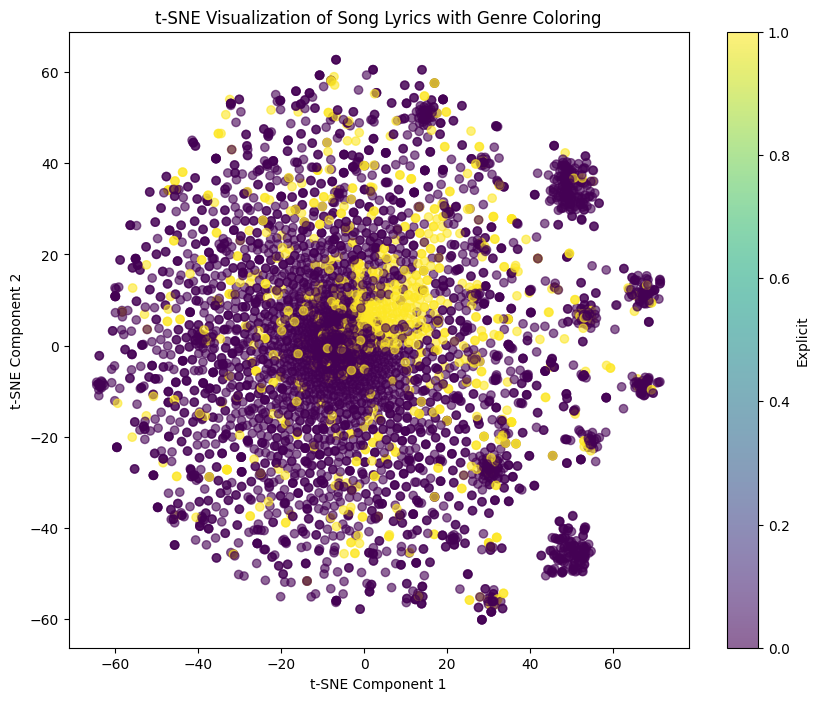

In [47]:
# Assuming 'genre_labels' is a list of genre labels corresponding to each song
plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=df['explicit'].replace({True: 1, False: 0, 'True': 1, 'False': 0}).astype(int).values, alpha=0.6)
plt.colorbar(scatter, label='Explicit')
plt.title('t-SNE Visualization of Song Lyrics with Genre Coloring')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

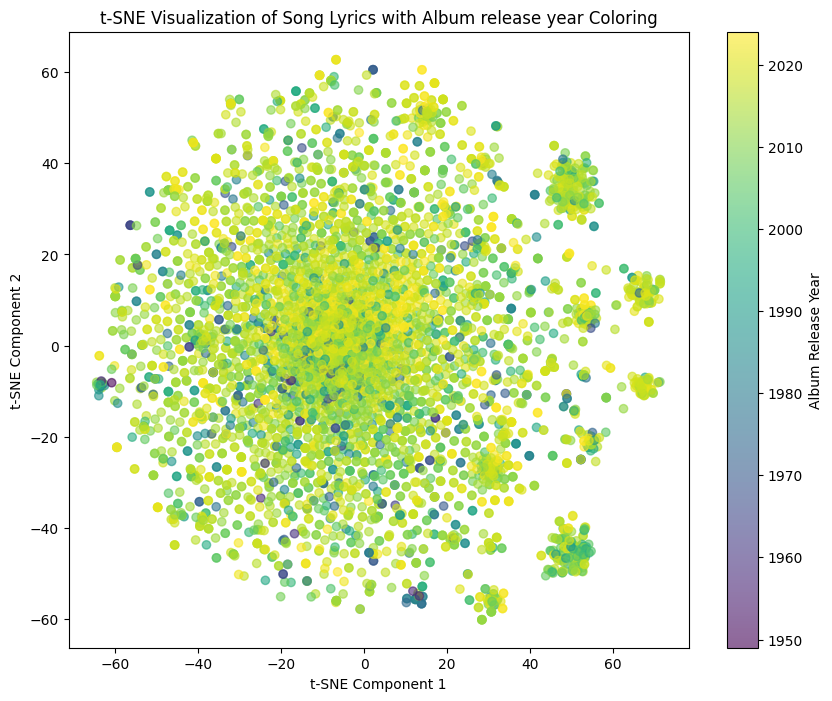

In [48]:
# Assuming 'genre_labels' is a list of genre labels corresponding to each song
plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=df['album_release_year'].astype(int).values, alpha=0.6)
plt.colorbar(scatter, label='Album Release Year')
plt.title('t-SNE Visualization of Song Lyrics with Album release year Coloring')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

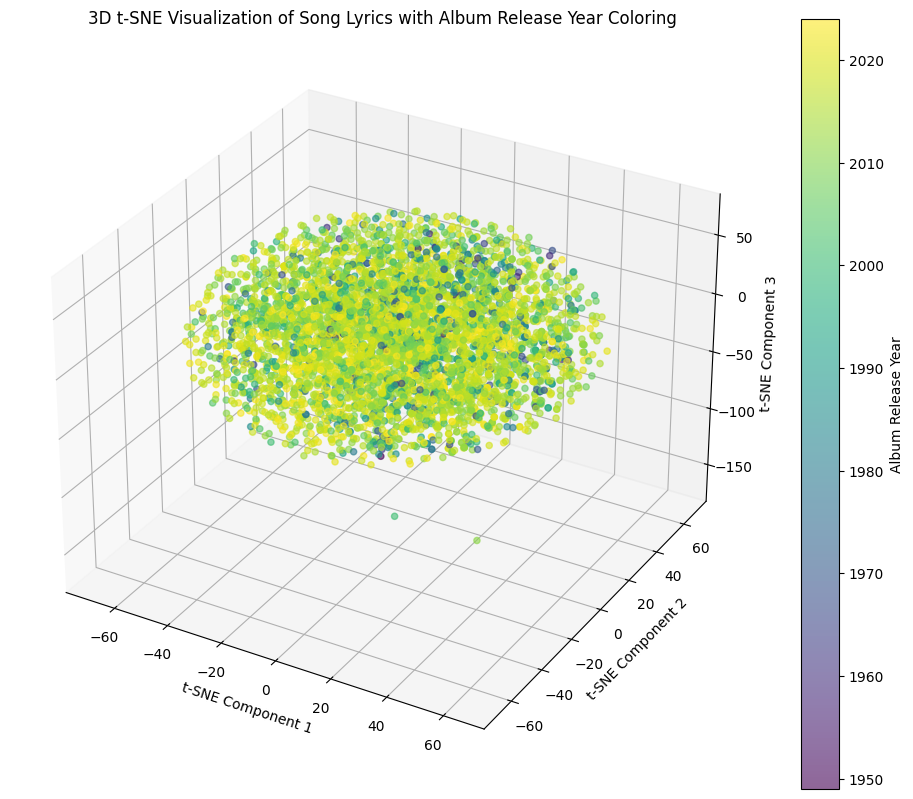

In [41]:
tsne = TSNE(n_components=3, random_state=0)
reduced_data_3d = tsne.fit_transform(tfidf_matrix.toarray())

# Plotting in 3D
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with album release year as the color dimension
scatter = ax.scatter(reduced_data_3d[:, 0], reduced_data_3d[:, 1], reduced_data_3d[:, 2],
                     c=df['album_release_year'].astype(int).values, cmap='viridis', alpha=0.6)

# Add color bar and labels
colorbar = fig.colorbar(scatter, ax=ax, label='Album Release Year')
ax.set_title('3D t-SNE Visualization of Song Lyrics with Album Release Year Coloring')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')

plt.show()

In [194]:
import numpy as np
import pandas as pd

# Assuming `clusters` is an array with cluster assignments and `tfidf_matrix` is the TF-IDF matrix
cluster_keywords = []
for cluster_id in np.unique(clusters):
    # Select rows corresponding to the current cluster
    cluster_indices = np.where(clusters == cluster_id)
    cluster_tfidf = tfidf_matrix[cluster_indices].mean(axis=0)
    
    # Get the top N words for the cluster
    top_n = 10
    top_words = np.array(tfidf_vectorizer.get_feature_names_out())[np.argsort(-cluster_tfidf.A.flatten())[:top_n]]
    cluster_keywords.append((cluster_id, top_words))

# Display keywords for each cluster
for cluster_id, keywords in cluster_keywords:
    print(f"Cluster {cluster_id}: {', '.join(keywords)}")


Cluster 0: da, uh, doo, ba, huh, everybody, yeah, summer, woo, hoo
Cluster 1: ll, let, heart, gonna, know, long, better, time, love, oh
Cluster 2: la, ah, don, oh, like, yes, woman, black, ll, know
Cluster 3: love, just, know, don, ve, say, ll, tell, chorus, like
Cluster 4: away, know, new, run, ll, don, oh, stay, just, forever
Cluster 5: que, te, el, la, mi, en, se, che, tu, lo
Cluster 6: don, know, way, somebody, love, like, just, ll, oh, wait
Cluster 7: nie, się, na, jak, mnie, tak, już, jest, ja, że
Cluster 8: home, coming, light, ll, christmas, just, know, don, river, love
Cluster 9: yeah, like, got, bitch, don, ain, know, shit, just, fuck
Cluster 10: na, come, bad, mind, little, oh, don, like, love, right
Cluster 11: oh, woah, whoa, chorus, like, know, don, love, ooh, high
Cluster 12: ooh, love, gone, just, ll, oh, don, hold, know, chorus
Cluster 13: love, want, baby, wanna, don, know, like, just, ain, oh
Cluster 14: wish, die, sorry, lay, hello, just, ll, falling, let, chorus
Cl

In [195]:
from textblob import TextBlob

df['sentiment'] = df['lyrics'].apply(lambda x: TextBlob(x).sentiment.polarity)
df['cluster'] = clusters

# Calculate average sentiment per cluster
cluster_sentiment = df.groupby('cluster')['sentiment'].mean()
print(cluster_sentiment)


cluster
0     0.101818
1     0.104716
2     0.085011
3     0.168338
4     0.102300
5     0.027205
6     0.124655
7     0.027178
8     0.093460
9     0.056945
10    0.053132
11    0.103566
12    0.098368
13    0.110519
14    0.078502
15    0.080043
16    0.119203
17    0.095611
Name: sentiment, dtype: float64


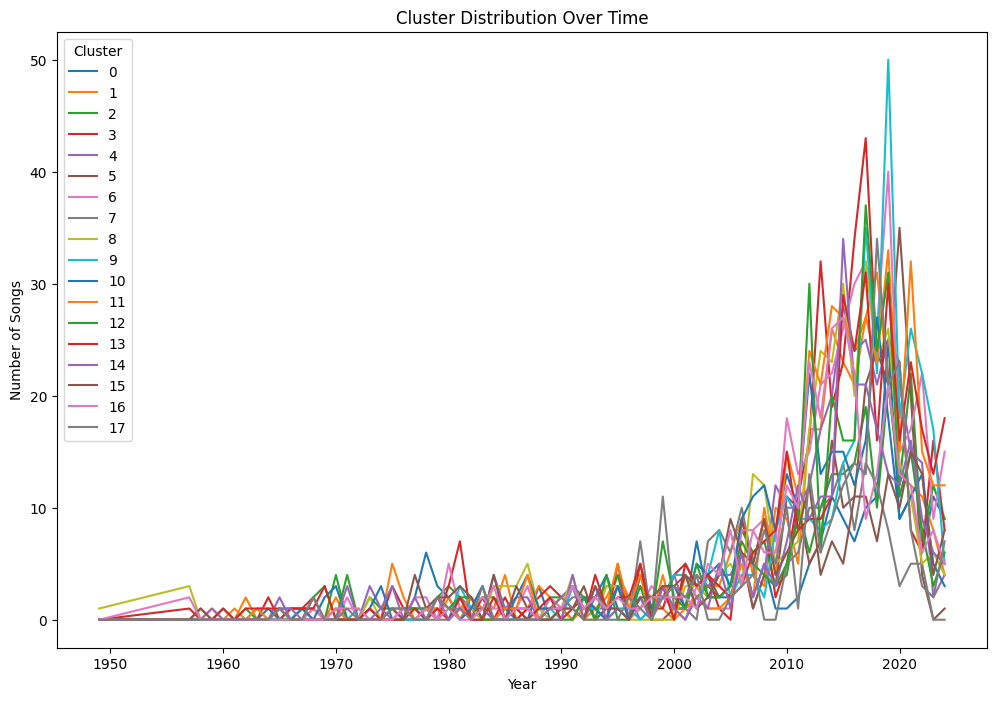

In [196]:
# Count the frequency of each cluster by year
df['release_year'] = df['album_release_year'].astype(int)
cluster_year_distribution = df.groupby(['release_year', 'cluster']).size().unstack(fill_value=0)

# Plot the trends over time
cluster_year_distribution.plot(figsize=(12, 8))
plt.title("Cluster Distribution Over Time")
plt.xlabel("Year")
plt.ylabel("Number of Songs")
plt.legend(title="Cluster")
plt.show()


In [2]:
import numpy as np
import pandas as pd
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Step 1: Simulated Input Data
# Assuming we have a binary album-label matrix where rows are albums and columns are labels.
# For simplicity, let's create a mock dataset:
np.random.seed(42)
num_albums = 500
num_labels = 50
album_label_matrix = np.random.randint(0, 2, size=(num_albums, num_labels))
album_label_matrix

array([[0, 1, 0, ..., 0, 1, 1],
       [0, 1, 0, ..., 1, 1, 0],
       [0, 1, 1, ..., 0, 0, 1],
       ...,
       [0, 1, 0, ..., 1, 1, 1],
       [1, 1, 0, ..., 0, 0, 1],
       [1, 0, 0, ..., 0, 1, 0]])

In [3]:
# Step 2: Compute the Co-occurrence Matrix (PPMI)
label_cooccurrence = np.dot(album_label_matrix.T, album_label_matrix)  # Label-label co-occurrence matrix
total_occurrences = label_cooccurrence.sum()
label_cooccurrence

array([[257, 126, 126, ..., 124, 127, 124],
       [126, 257, 120, ..., 124, 135, 124],
       [126, 120, 237, ..., 123, 110, 121],
       ...,
       [124, 124, 123, ..., 253, 132, 128],
       [127, 135, 110, ..., 132, 252, 108],
       [124, 124, 121, ..., 128, 108, 238]])

In [ ]:
# Compute PPMI
ppmi_matrix = np.maximum(0, np.log((label_cooccurrence * total_occurrences) /
                                   (label_cooccurrence.sum(axis=1, keepdims=True) * 
                                    label_cooccurrence.sum(axis=0, keepdims=True))))
np.fill_diagonal(ppmi_matrix, 0)  # Remove self-loops

# Step 3: Apply Singular Value Decomposition (SVD) to Get Label Factors
svd = TruncatedSVD(n_components=10, random_state=42)
label_factors = svd.fit_transform(ppmi_matrix)

# Step 4: Compute Album Factors
# Project album-label matrix into label factor space
album_factors = np.dot(album_label_matrix, label_factors)

# Step 5: Visualize with t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200)
album_tsne = tsne.fit_transform(album_factors)

# Step 6: Plot the t-SNE Results
plt.figure(figsize=(10, 8))
plt.scatter(album_tsne[:, 0], album_tsne[:, 1], c='blue', alpha=0.5, s=10)
plt.title("t-SNE Visualization of Album Factors")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

# Test Lyrical Complexity and Popularity
Hypothesis: Songs with simpler lyrics (lower syllable count, higher readability) are more likely to be popular.

Missing Value Summary:
syllable_count         0
readability_score      0
unique_word_count      0
popularity           556
dtype: int64
'syllable_count' unique values: 626
'readability_score' unique values: 596
'unique_word_count' unique values: 262
'popularity' unique values: 96

Lyrical Complexity Correlations with Popularity:
syllable_count: 0.108
readability_score: 0.124
unique_word_count: 0.082


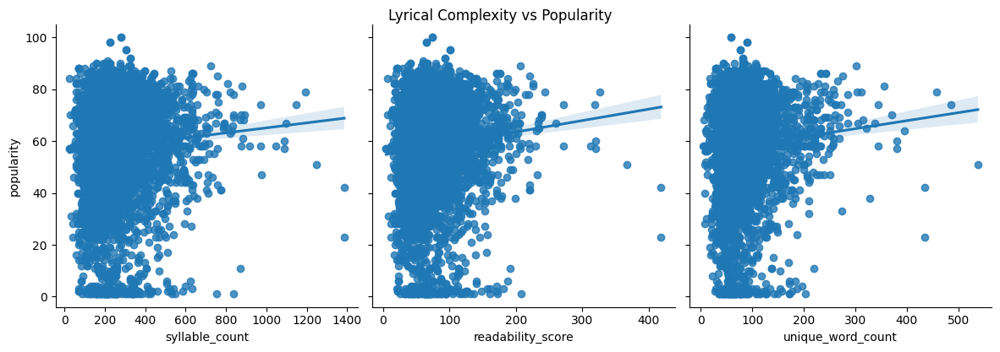

In [18]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# Relevant columns
lyrical_features = ['syllable_count', 'readability_score', 'unique_word_count']
target_column = 'popularity'

# Ensure relevant columns exist
for feature in lyrical_features + [target_column]:
    if feature not in df.columns:
        raise ValueError(f"Missing required column: {feature}")

# Debug missing values
print("Missing Value Summary:")
print(df[lyrical_features + [target_column]].isnull().sum())

# Fill missing values with the mean for each column
df[lyrical_features + [target_column]] = df[lyrical_features + [target_column]].fillna(df.mean())

# Check if any columns are constant
for feature in lyrical_features + [target_column]:
    unique_values = df[feature].nunique()
    print(f"'{feature}' unique values: {unique_values}")
    if unique_values <= 1:
        print(f"'{feature}' has no variability (constant or missing). Excluding from analysis.")

# Filter for valid rows (non-missing, non-constant data)
df_filtered = df[lyrical_features + [target_column]].dropna()

# Recheck after filtering
if df_filtered.empty:
    raise ValueError("Filtered dataset is empty after removing missing or constant values.")

# Correlation Analysis
correlations = {}
for feature in lyrical_features:
    correlation, p_value = spearmanr(df_filtered[feature], df_filtered[target_column])
    correlations[feature] = correlation

# Print correlations
print("\nLyrical Complexity Correlations with Popularity:")
for feature, corr in correlations.items():
    print(f"{feature}: {corr:.3f}")

# Visualize the relationships
sns.pairplot(df_filtered, x_vars=lyrical_features, y_vars=target_column, kind='reg', height=4)
plt.suptitle("Lyrical Complexity vs Popularity", y=1.02)
plt.show()


In [19]:
from scipy.stats import spearmanr

# Define target and features
target_column = 'popularity'
lyrical_features = ['syllable_count', 'readability_score', 'unique_word_count']

# Dictionary to store test results
test_results = {}

# Loop through each lyrical feature
for feature in lyrical_features:
    # Perform Spearman's rank correlation test
    corr, p_value = spearmanr(df_filtered[feature], df_filtered[target_column])
    test_results[feature] = {'correlation': corr, 'p_value': p_value}

# Print results
print("Statistical Test Results:")
for feature, result in test_results.items():
    print(f"{feature}: Correlation = {result['correlation']:.3f}, p-value = {result['p_value']:.3f}")

    # Conclusion
    if result['p_value'] <= 0.05:
        print(f"  -> Reject H₀: Significant relationship between {feature} and popularity.")
    else:
        print(f"  -> Fail to Reject H₀: No significant relationship between {feature} and popularity.")


Statistical Test Results:
syllable_count: Correlation = 0.108, p-value = 0.000
  -> Reject H₀: Significant relationship between syllable_count and popularity.
readability_score: Correlation = 0.124, p-value = 0.000
  -> Reject H₀: Significant relationship between readability_score and popularity.
unique_word_count: Correlation = 0.082, p-value = 0.000
  -> Reject H₀: Significant relationship between unique_word_count and popularity.


In [20]:
from statsmodels.stats.multitest import multipletests

# Extract p-values
p_values = [result['p_value'] for result in test_results.values()]

# Apply FDR correction
reject, pvals_corrected, _, _ = multipletests(p_values, method='fdr_bh')

# Update results with corrected p-values
for i, feature in enumerate(lyrical_features):
    test_results[feature]['p_value_corrected'] = pvals_corrected[i]
    test_results[feature]['reject_null'] = reject[i]

# Print results after correction
print("\nResults After FDR Correction:")
for feature, result in test_results.items():
    print(f"{feature}: Corrected p-value = {result['p_value_corrected']:.3f}")
    if result['reject_null']:
        print(f"  -> Reject H₀: Significant relationship after FDR correction.")
    else:
        print(f"  -> Fail to Reject H₀ after FDR correction.")



Results After FDR Correction:
syllable_count: Corrected p-value = 0.000
  -> Reject H₀: Significant relationship after FDR correction.
readability_score: Corrected p-value = 0.000
  -> Reject H₀: Significant relationship after FDR correction.
unique_word_count: Corrected p-value = 0.000
  -> Reject H₀: Significant relationship after FDR correction.


## Statistical Test Results and Interpretation

### Statistical Test Results

1. **Syllable Count**:
   - **Correlation**: 0.108 (weak positive correlation).
   - **P-value**: 0.000 (significant).
   - **Conclusion**: Songs with higher syllable counts in their lyrics are slightly more likely to be popular.

2. **Readability Score**:
   - **Correlation**: 0.124 (weak positive correlation).
   - **P-value**: 0.000 (significant).
   - **Conclusion**: Higher readability (i.e., easier-to-read lyrics) is weakly associated with higher popularity.

3. **Unique Word Count**:
   - **Correlation**: 0.082 (weak positive correlation).
   - **P-value**: 0.000 (significant).
   - **Conclusion**: A slight positive relationship exists between a greater variety of unique words and song popularity.

---

### Interpretation for Your Thesis

The significant results suggest a relationship between lyrical complexity and song popularity, though the correlations are relatively weak. These findings can be interpreted as follows:

1. **Hypothesis Support**:
   - The hypothesis that lyrical features influence popularity is **supported**, but the effect size (correlation strength) is small.
   - This indicates that lyrical features are not the sole determinants of popularity and other factors (e.g., acoustic features, artist reputation) play more substantial roles.

2. **Practical Insight**:
   - Listeners may value lyrical features to some extent, but the weak correlation implies their influence is limited compared to other factors.
   - Readability, in particular, seems to have the most noticeable impact, suggesting that easily digestible lyrics might contribute to a song's broader appeal.

3. **Further Steps**:
   - Conduct similar tests on **acoustic features** to see if they show stronger correlations with popularity.
   - Perform a **multivariate regression analysis** to determine the combined influence of lyrical and acoustic features.
   - Use **SHAP (SHapley Additive exPlanations)** values in predictive models to quantify the contribution of individual features (lyrical and acoustic) to popularity.


# Sentiment and Genre: Sentiment polarity and subjectivity vary significantly across genres.

Hypothesis: Sentiment polarity and subjectivity vary significantly across genres.
Use clustering and sentiment analysis to group genres by sentiment characteristics.

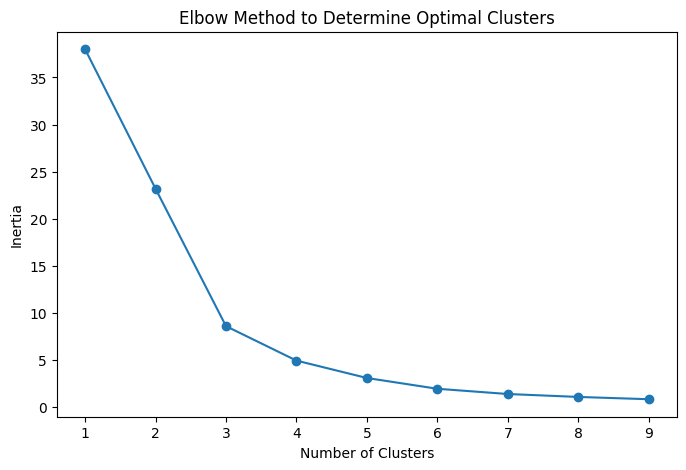

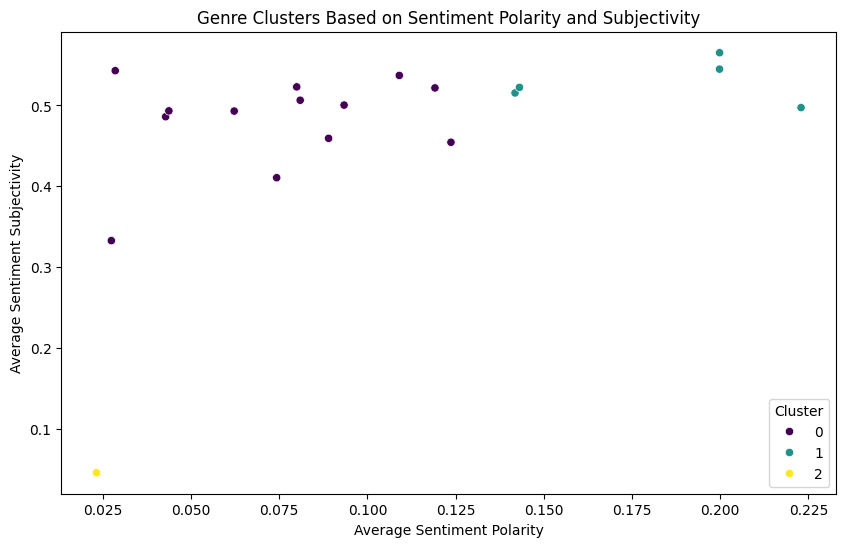

In [24]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob

genre_sentiment = df.groupby('genre')[['sentiment_polarity', 'sentiment_subjectivity']].mean().dropna()

# Step 3: Standardize data for clustering
scaler = StandardScaler()
scaled_data = scaler.fit_transform(genre_sentiment)

# Step 4: Determine optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(k_values, inertia, marker='o')
plt.title('Elbow Method to Determine Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

# Step 5: Apply KMeans clustering
optimal_k = 3  # Choose based on the elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
genre_sentiment['cluster'] = kmeans.fit_predict(scaled_data)

# Step 6: Visualize clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=genre_sentiment['sentiment_polarity'],
    y=genre_sentiment['sentiment_subjectivity'],
    hue=genre_sentiment['cluster'],
    palette='viridis',
    # s=100
)
plt.title('Genre Clusters Based on Sentiment Polarity and Subjectivity')
plt.xlabel('Average Sentiment Polarity')
plt.ylabel('Average Sentiment Subjectivity')
plt.legend(title='Cluster')
plt.show()

# Step 7: Save results for further exploration
# genre_sentiment.to_csv("genre_sentiment_clusters.csv")


In [27]:
df_clustered = genre_sentiment.reset_index()

In [28]:
df_clustered

,genre,sentiment_polarity,sentiment_subjectivity,cluster
0,alternative,0.023237,0.046058,2
1,classical,0.109051,0.537053,0
2,country,0.074298,0.410642,0
3,dance,0.141847,0.515438,1
4,electronic,0.123688,0.454464,0
5,experimental,0.062256,0.493013,0
6,folk,0.080963,0.506393,0
7,grime,0.042827,0.486045,0
8,hip hop,0.043746,0.493243,0
9,house,0.222901,0.497297,1


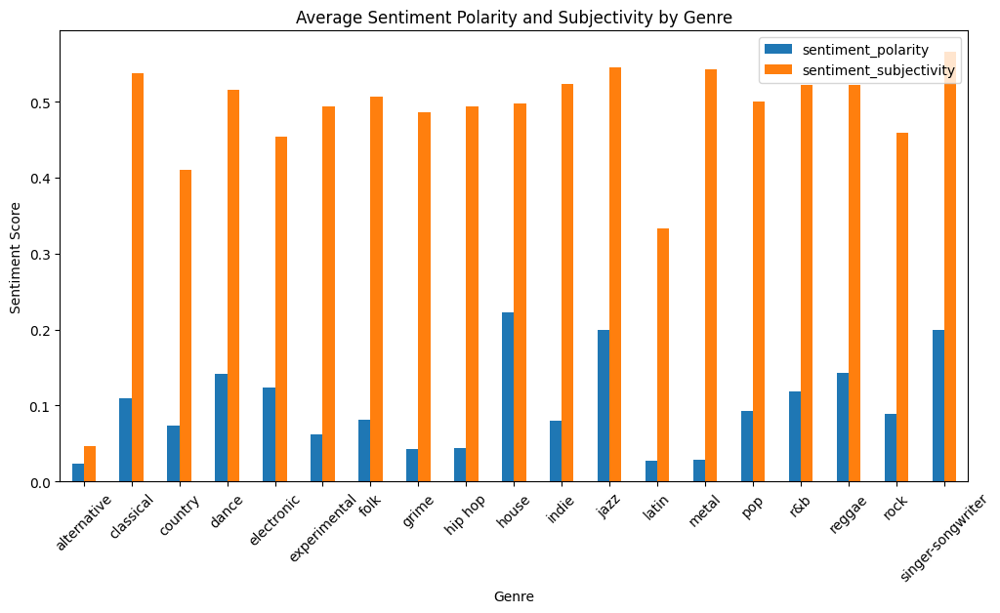

In [30]:
# Calculate average sentiment scores by genre
genre_sentiment = df.groupby('genre')[['sentiment_polarity', 'sentiment_subjectivity']].mean()

# Plot sentiment polarity and subjectivity by genre
genre_sentiment.plot(kind='bar', figsize=(12, 6))
plt.title("Average Sentiment Polarity and Subjectivity by Genre")
plt.xlabel("Genre")
plt.ylabel("Sentiment Score")
plt.xticks(rotation=45)
plt.show()


In [37]:
from scipy.stats import f_oneway
genre_counts = df['genre'].value_counts()

# Filter genres with at least 5 songs
min_genre_size = 5
valid_genres = genre_counts[genre_counts >= min_genre_size].index
df_anova = df[df['genre'].isin(valid_genres)]


# Extract sentiment polarity and genres
polarity_by_genre = [df_anova.loc[df_anova['genre'] == genre, 'sentiment_polarity'] for genre in df_anova['genre'].unique()]
subjectivity_by_genre = [df_anova.loc[df_anova['genre'] == genre, 'sentiment_subjectivity'] for genre in df_anova['genre'].unique()]

# Perform ANOVA
polarity_anova = f_oneway(*polarity_by_genre)
subjectivity_anova = f_oneway(*subjectivity_by_genre)

print(f"Polarity ANOVA: F-statistic = {polarity_anova.statistic:.3f}, p-value = {polarity_anova.pvalue:.3f}")
print(f"Subjectivity ANOVA: F-statistic = {subjectivity_anova.statistic:.3f}, p-value = {subjectivity_anova.pvalue:.3f}")

Polarity ANOVA: F-statistic = 4.158, p-value = 0.000
Subjectivity ANOVA: F-statistic = 9.422, p-value = 0.000


Results Recap:
Polarity ANOVA:

F-statistic = 4.158
p-value = 0.000
Conclusion: Reject the null hypothesis (H₀). There is a significant difference in sentiment polarity among genres.
Subjectivity ANOVA:

F-statistic = 9.422
p-value = 0.000
Conclusion: Reject the null hypothesis (H₀). There is a significant difference in sentiment subjectivity among genres.
These results indicate that both sentiment polarity and subjectivity vary significantly across genres.



In [40]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np

df = df.dropna(subset=['genre'])
# Perform Tukey HSD for polarity
tukey_polarity = pairwise_tukeyhsd(
    endog=df['sentiment_polarity'],   # Dependent variable
    groups=df['genre'],              # Grouping variable
    alpha=0.05                       # Significance level
)
print("Tukey HSD for Sentiment Polarity:")
print(tukey_polarity)

# Perform Tukey HSD for subjectivity
tukey_subjectivity = pairwise_tukeyhsd(
    endog=df['sentiment_subjectivity'],
    groups=df['genre'],
    alpha=0.05
)
print("Tukey HSD for Sentiment Subjectivity:")
print(tukey_subjectivity)


Tukey HSD for Sentiment Polarity:
         Multiple Comparison of Means - Tukey HSD, FWER=0.05         
   group1          group2      meandiff p-adj   lower   upper  reject
---------------------------------------------------------------------
 alternative         classical   0.0858  0.999 -0.1495  0.3211  False
 alternative           country   0.0511    1.0 -0.1735  0.2756  False
 alternative             dance   0.1186 0.8799 -0.0883  0.3255  False
 alternative        electronic   0.1005 0.9727 -0.1066  0.3075  False
 alternative      experimental    0.039    1.0 -0.1823  0.2603  False
 alternative              folk   0.0577    1.0 -0.1463  0.2617  False
 alternative             grime   0.0196    1.0 -0.2278   0.267  False
 alternative           hip hop   0.0205    1.0 -0.1762  0.2172  False
 alternative             house   0.1997 0.8735 -0.1463  0.5457  False
 alternative             indie   0.0567    1.0 -0.1439  0.2574  False
 alternative              jazz   0.1766  0.363 -0.0487  

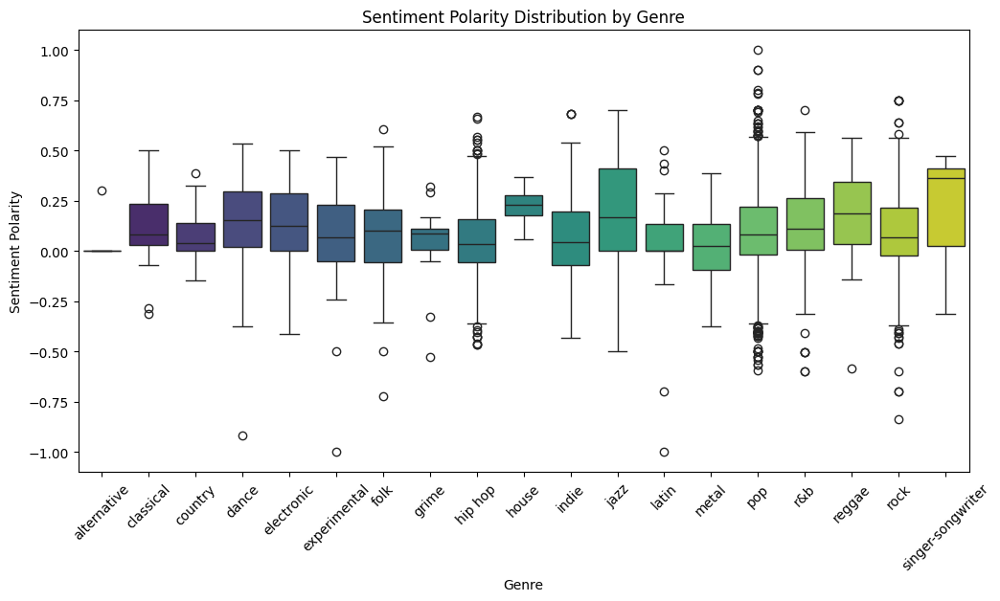

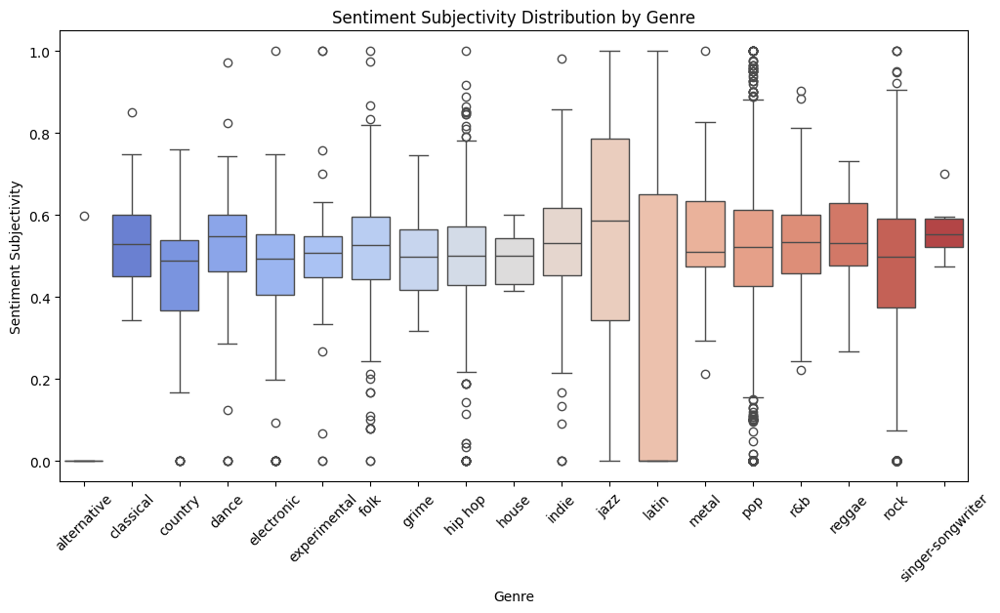

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot sentiment polarity by genre
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='genre', y='sentiment_polarity', palette='viridis')
plt.title("Sentiment Polarity Distribution by Genre")
plt.xlabel("Genre")
plt.ylabel("Sentiment Polarity")
plt.xticks(rotation=45)
plt.show()

# Plot sentiment subjectivity by genre
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='genre', y='sentiment_subjectivity', palette='coolwarm')
plt.title("Sentiment Subjectivity Distribution by Genre")
plt.xlabel("Genre")
plt.ylabel("Sentiment Subjectivity")
plt.xticks(rotation=45)
plt.show()


In [34]:
# Compute correlations between sentiment and popularity per genre
correlations = df.groupby('genre')[['sentiment_polarity', 'sentiment_subjectivity', 'popularity']].corr().iloc[0::3, -1]

print("Sentiment-Popularity Correlation by Genre:")
print(correlations)


Sentiment-Popularity Correlation by Genre:
genre                                
alternative        sentiment_polarity    0.390390
classical          sentiment_polarity   -0.057552
country            sentiment_polarity   -0.045235
dance              sentiment_polarity    0.081239
electronic         sentiment_polarity    0.212038
experimental       sentiment_polarity    0.162695
folk               sentiment_polarity   -0.137999
grime              sentiment_polarity   -0.094652
hip hop            sentiment_polarity   -0.001037
house              sentiment_polarity    0.057794
indie              sentiment_polarity    0.097657
jazz               sentiment_polarity   -0.173661
latin              sentiment_polarity    0.237525
metal              sentiment_polarity   -0.176273
pop                sentiment_polarity   -0.003041
r&b                sentiment_polarity    0.044916
reggae             sentiment_polarity    0.691814
rock               sentiment_polarity    0.018716
singer-songwriter  

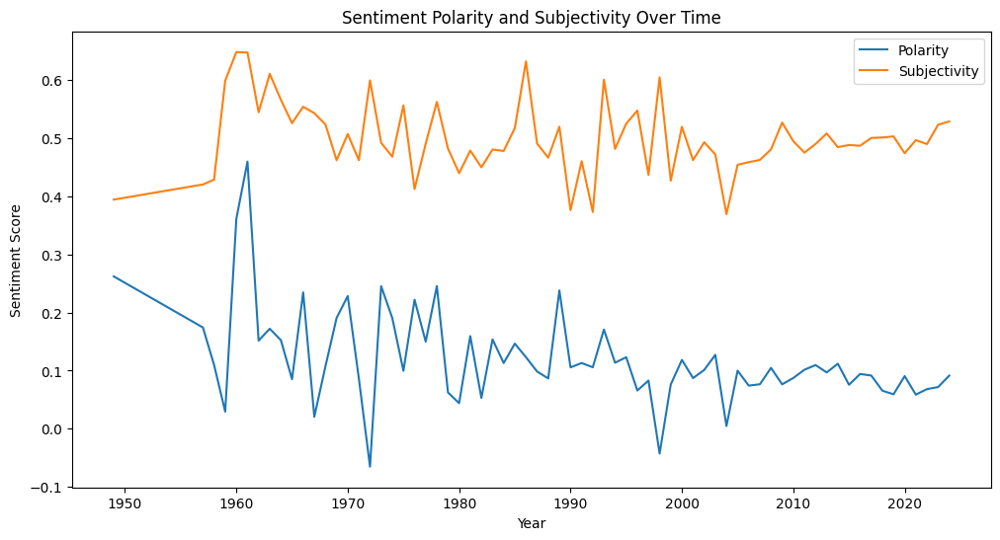

In [35]:
# Group by year and calculate average sentiment
sentiment_over_time = df.groupby('album_release_year')[['sentiment_polarity', 'sentiment_subjectivity']].mean()

# Plot sentiment trends
sentiment_over_time.plot(figsize=(12, 6))
plt.title("Sentiment Polarity and Subjectivity Over Time")
plt.xlabel("Year")
plt.ylabel("Sentiment Score")
plt.legend(["Polarity", "Subjectivity"])
plt.show()


# Temporal Trends in Features:

Hypothesis: Newer songs (recent album release years) tend to have shorter durations and simpler structures (lower syllable count, fewer unique words).
Perform a temporal analysis to verify how features evolve over time.

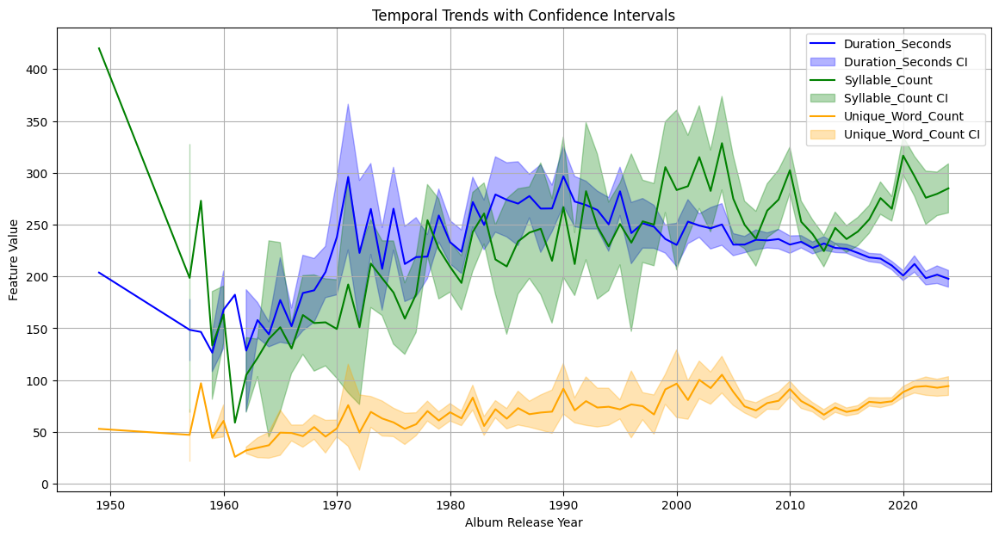

In [48]:
import numpy as np

# Group data by year and compute mean, std, and count
agg_data = df.groupby('album_release_year').agg({
    'duration_seconds': ['mean', 'std', 'count'],
    'syllable_count': ['mean', 'std', 'count'],
    'unique_word_count': ['mean', 'std', 'count']
})

# Flatten multi-level columns
agg_data.columns = ['_'.join(col) for col in agg_data.columns]

# Compute 95% confidence intervals
for feature in ['duration_seconds', 'syllable_count', 'unique_word_count']:
    mean_col = f"{feature}_mean"
    std_col = f"{feature}_std"
    count_col = f"{feature}_count"
    agg_data[f"{feature}_ci_lower"] = agg_data[mean_col] - 1.96 * (agg_data[std_col] / np.sqrt(agg_data[count_col]))
    agg_data[f"{feature}_ci_upper"] = agg_data[mean_col] + 1.96 * (agg_data[std_col] / np.sqrt(agg_data[count_col]))

# Plot temporal trends with manual confidence intervals
plt.figure(figsize=(14, 7))
for feature, color in zip(['duration_seconds', 'syllable_count', 'unique_word_count'], ['blue', 'green', 'orange']):
    plt.plot(agg_data.index, agg_data[f"{feature}_mean"], label=f"{feature.title()}", color=color)
    plt.fill_between(
        agg_data.index, 
        agg_data[f"{feature}_ci_lower"], 
        agg_data[f"{feature}_ci_upper"], 
        color=color, alpha=0.3, label=f"{feature.title()} CI"
    )
plt.title("Temporal Trends with Confidence Intervals")
plt.xlabel("Album Release Year")
plt.ylabel("Feature Value")
plt.legend()
plt.grid()
plt.show()


In [45]:
from scipy.stats import linregress

# Perform linear regression for each feature
features = ['duration_seconds', 'syllable_count', 'unique_word_count']
for feature in features:
    slope, intercept, r_value, p_value, std_err = linregress(temporal_trends['album_release_year'], temporal_trends[feature])
    print(f"{feature} vs. album_release_year:")
    print(f"  Slope = {slope:.3f}")
    print(f"  p-value = {p_value:.3e}")
    print(f"  R-squared = {r_value**2:.3f}\n")


duration_seconds vs. album_release_year:
  Slope = 0.672
  p-value = 4.029e-03
  R-squared = 0.117

syllable_count vs. album_release_year:
  Slope = 1.801
  p-value = 5.277e-08
  R-squared = 0.359

unique_word_count vs. album_release_year:
  Slope = 0.622
  p-value = 2.695e-12
  R-squared = 0.520



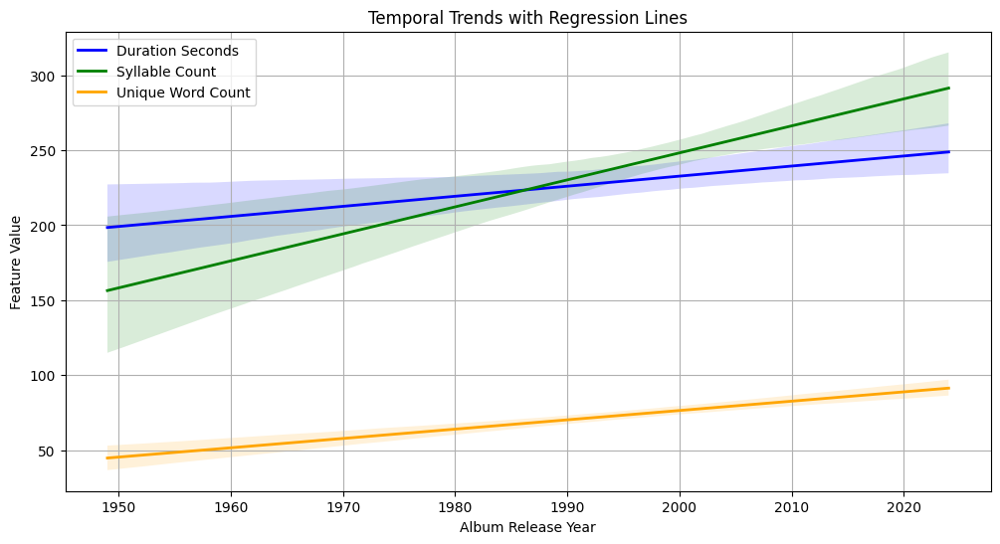

In [46]:
# Plot temporal trends with regression lines
plt.figure(figsize=(12, 6))
for feature, color in zip(['duration_seconds', 'syllable_count', 'unique_word_count'], ['blue', 'green', 'orange']):
    sns.regplot(
        data=temporal_trends, 
        x='album_release_year', 
        y=feature, 
        label=f"{feature.replace('_', ' ').title()}", 
        scatter=False, 
        color=color, 
        line_kws={'linewidth': 2}
    )
plt.title("Temporal Trends with Regression Lines")
plt.xlabel("Album Release Year")
plt.ylabel("Feature Value")
plt.legend()
plt.grid()
plt.show()


# Acoustic Features and Explicitness:

Hypothesis: Songs marked as explicit have distinct acoustic features such as higher energy or louder dynamics compared to non-explicit ones.
Use classification models to test the separability of explicit vs. non-explicit songs based on acoustic features.

In [55]:
num_acoustic_features = [
 'danceability',
 'energy',
 'loudness',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'mfcc_1',
 'mfcc_2',
 'mfcc_3',
 'mfcc_4',
 'mfcc_5',
 'mfcc_6',
 'mfcc_7',
 'mfcc_8',
 'mfcc_9',
 'mfcc_10',
 'mfcc_11',
 'mfcc_12',
 'mfcc_13',
 'chroma_1',
 'chroma_2',
 'chroma_3',
 'chroma_4',
 'chroma_5',
 'chroma_6',
 'chroma_7',
 'chroma_8',
 'chroma_9',
 'chroma_10',
 'chroma_11',
 'chroma_12',
 'spectral_contrast_1',
 'spectral_contrast_2',
 'spectral_contrast_3',
 'spectral_contrast_4',
 'spectral_contrast_5',
 'spectral_contrast_6',
 'spectral_contrast_7',
 'tempo_extracted',
 'zcr',
]
cat_acoustic_features = ['key', 'mode', 'time_signature']

# Optimal Classification

In [56]:
from classes.model_pipeline import OptimalClassificationPipeline

In [67]:
target = 'explicit'

In [68]:
cat_acoustic_features

['key', 'mode', 'time_signature']

In [69]:
clf_pipeline = OptimalClassificationPipeline(
    df.dropna(subset=[target]),
    target_column=target,
    num_features=num_acoustic_features,
    cat_features=cat_acoustic_features,
    n_trials=10,
    param_grid={
        "iterations": [500, 1000],
        "depth": [4, 6, 8],
        "learning_rate": (0.01, 0.1),
        "l2_leaf_reg": (1, 10),
    },
    cache_path="catboost_optuna.db"
)
clf_pipeline.get_pipeline()

INFO: Initializing pipeline for target variable: explicit
INFO: Setting up the pipeline...
INFO: Setting up the pipeline...


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['danceability', 'energy',
                                                   'loudness', 'speechiness',
                                                   'acousticness',
                                                   'instrumentalness',
                                                   'liveness', 'valence',
                                                   'tempo', 'mfcc_1', 'mfcc_2',
                                                   'mfcc_3', 'mfcc_4', 'mfcc_5',
                                                   'mfcc_6', 'mfcc_7', 'mfcc...
                                                   'mfcc_13', 'chroma_1',
                                                   'chroma_2', 'chroma_3',
                                                   'chroma_4', 'chroma_5',
                                                   'chroma_6', 'chroma_7',
                                                   'chroma_8', ...]),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='unknown',
                                                                                 strategy='constant'))]),
                                                  ['key', 'mode',
                                                   'time_signature'])],
                                   verbose_feature_names_out=False)),
                ('model',
                 <classes.optimal_catboost.OptimalCatBoostClassifier object at 0x74207a816c80>)])

In [70]:
clf_pipeline.split()
clf_pipeline.train_model()

INFO: Splitting the data into training and testing sets...
INFO: Data splitting completed.
INFO: Training the OptimalCatBoostClassifier through the pipeline...


[I 2024-12-07 04:16:04,198] A new study created in RDB with name: catboost_explicit
[I 2024-12-07 04:17:30,999] Trial 4 finished with value: 0.8408946687843801 and parameters: {'iterations': 1000, 'depth': 4, 'learning_rate': 0.014607742440101464, 'l2_leaf_reg': 5.287981392986355}. Best is trial 4 with value: 0.8408946687843801.
[I 2024-12-07 04:17:31,639] Trial 0 finished with value: 0.867385932866517 and parameters: {'iterations': 1000, 'depth': 4, 'learning_rate': 0.03286569561456673, 'l2_leaf_reg': 3.4520474287255065}. Best is trial 0 with value: 0.867385932866517.
[I 2024-12-07 04:17:32,352] Trial 7 finished with value: 0.8727845401516923 and parameters: {'iterations': 1000, 'depth': 4, 'learning_rate': 0.06273065944160273, 'l2_leaf_reg': 5.29293724278514}. Best is trial 7 with value: 0.8727845401516923.
[I 2024-12-07 04:18:35,562] Trial 5 finished with value: 0.8809689358646227 and parameters: {'iterations': 1000, 'depth': 6, 'learning_rate': 0.03823748769883058, 'l2_leaf_reg': 9

INFO: Pipeline training completed.


In [71]:
clf_pipeline.model.training_results

,Metric,Score
0,Accuracy,0.893
1,F1 Score,0.885
2,Precision,0.885
3,Recall,0.893


INFO: Evaluating the model...


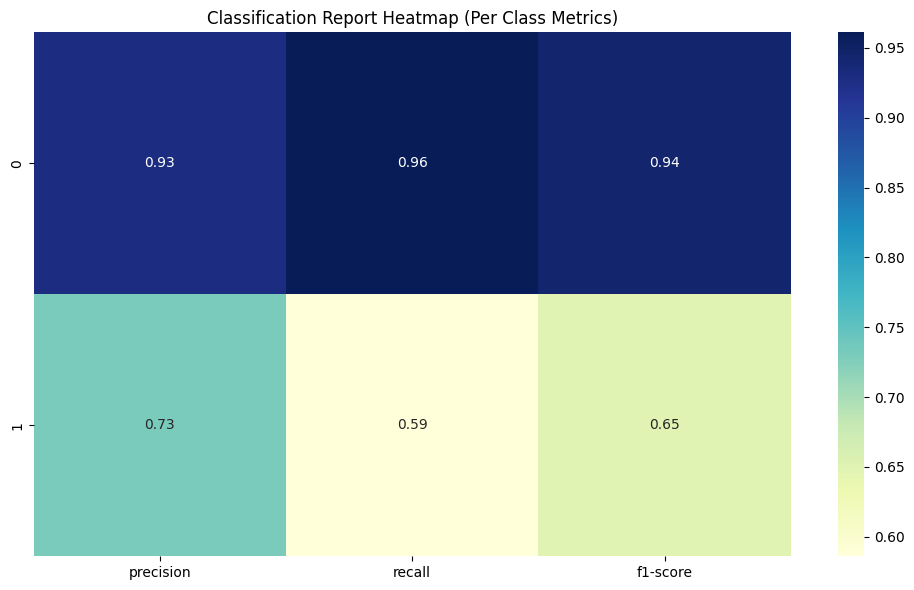

,precision,recall,f1-score,support
0,0.928177,0.961098,0.944351,874.000000
1,0.730159,0.585987,0.650177,157.000000
accuracy,0.903977,0.903977,0.903977,0.903977
macro avg,0.829168,0.773543,0.797264,1031.000000
weighted avg,0.898023,0.903977,0.899554,1031.000000


In [72]:
clf_pipeline.evaluate_model()

INFO: Performing SHAP analysis...
INFO: Binary classification or regression detected.


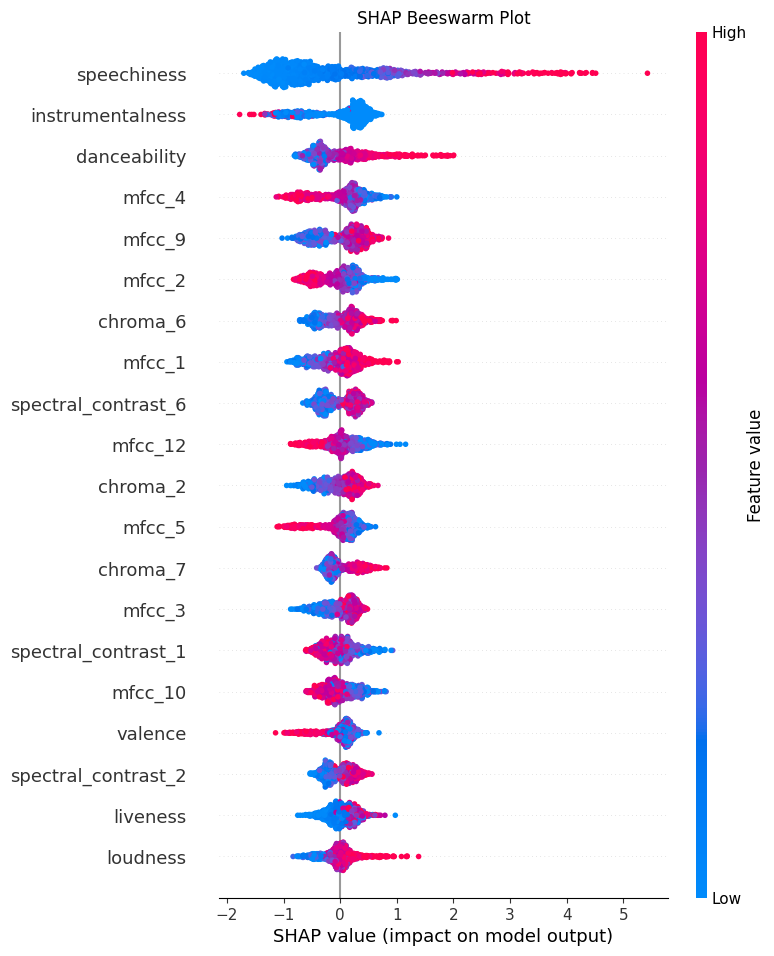

INFO: Generating feature importance bar plot...


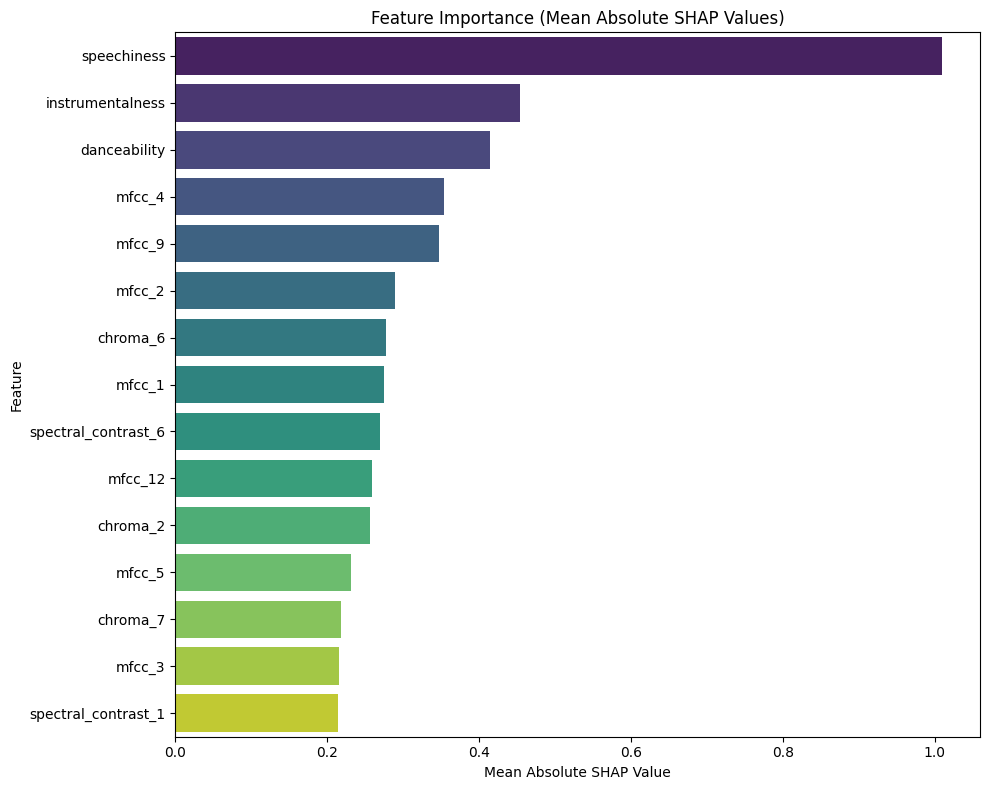

In [73]:
clf_pipeline.perform_shap_analysis()

# Genre-Specific Analysis
Objective: Investigate which acoustic or textual features dominate specific genres.

In [88]:
df = df[df.genre != 'None']

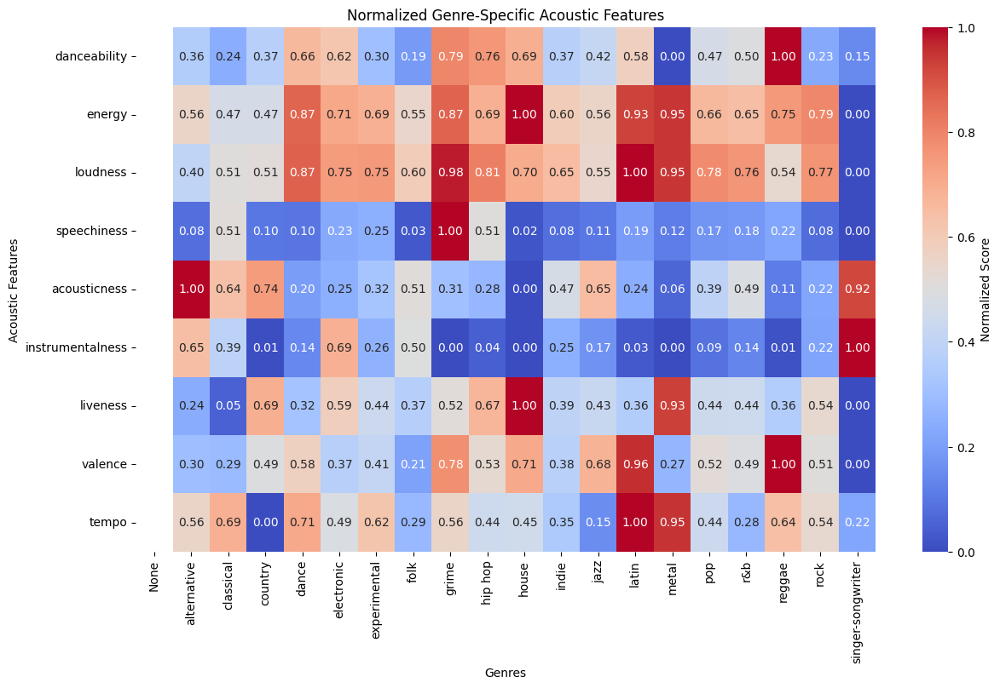

In [91]:
from sklearn.preprocessing import MinMaxScaler

# Select only the relevant features for normalization
features = ['danceability', 'energy', 'loudness', 'speechiness', 
            'acousticness', 'instrumentalness', 'liveness', 
            'valence', 'tempo']

# Group by genre and calculate mean acoustic features
genre_means = df.groupby('genre')[features].mean()

# Normalize each feature across genres using MinMaxScaler
scaler = MinMaxScaler()
normalized_genre_means = pd.DataFrame(scaler.fit_transform(genre_means), 
                                      columns=genre_means.columns, 
                                      index=genre_means.index)

# Heatmap to visualize normalized dominant features
plt.figure(figsize=(14, 8))
sns.heatmap(normalized_genre_means.T, cmap="coolwarm", annot=True, fmt=".2f", cbar_kws={'label': 'Normalized Score'})
plt.title("Normalized Genre-Specific Acoustic Features")
plt.xlabel("Genres")
plt.ylabel("Acoustic Features")
plt.show()


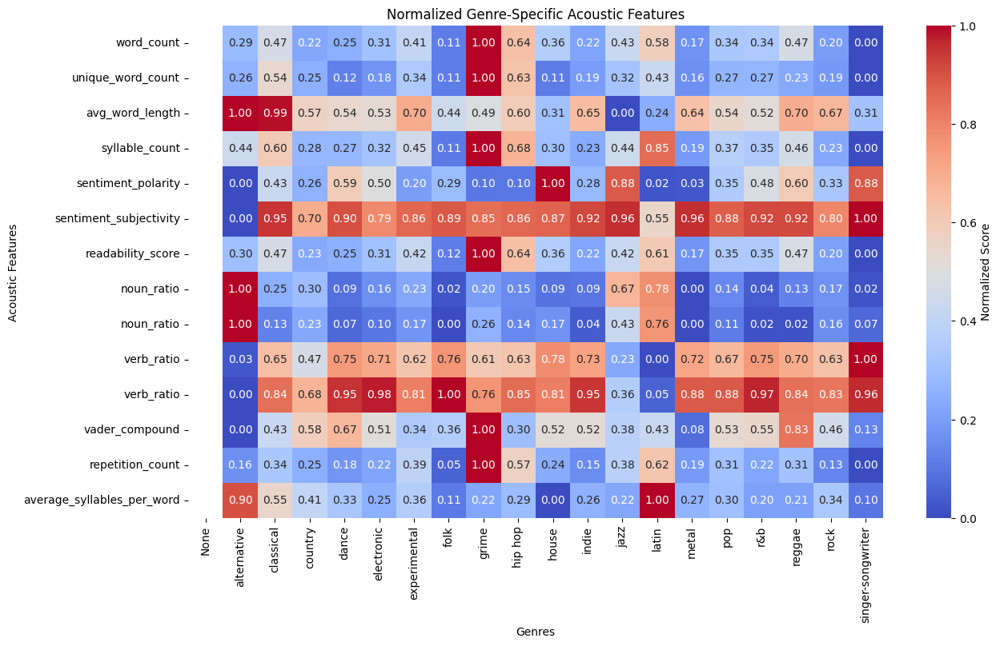

In [93]:
from sklearn.preprocessing import MinMaxScaler

genre_means = df.groupby('genre')[lyrics_features].mean()

# Normalize each feature across genres using MinMaxScaler
scaler = MinMaxScaler()
normalized_genre_means = pd.DataFrame(scaler.fit_transform(genre_means), 
                                      columns=genre_means.columns, 
                                      index=genre_means.index)

# Heatmap to visualize normalized dominant features
plt.figure(figsize=(14, 8))
sns.heatmap(normalized_genre_means.T, cmap="coolwarm", annot=True, fmt=".2f", cbar_kws={'label': 'Normalized Score'})
plt.title("Normalized Genre-Specific Acoustic Features")
plt.xlabel("Genres")
plt.ylabel("Acoustic Features")
plt.show()

# Co-occurrence Patterns in Textual Data
Objective: Perform topic modeling or co-occurrence analysis to uncover common themes or phrases in lyrics.

In [95]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Vectorize lyrics
lyrics_texts = df['lyrics'].dropna()
vectorizer = CountVectorizer(stop_words='english', max_features=1000)
X_lyrics = vectorizer.fit_transform(lyrics_texts)

# Perform LDA
lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda.fit(X_lyrics)

# Display topics
feature_names = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(lda.components_):
    print(f"Topic {topic_idx}:")
    print(", ".join([feature_names[i] for i in topic.argsort()[:-11:-1]]))


Topic 0:
la, na, da, tu, le, je, di, che, non, se
Topic 1:
love, like, time, ill, know, danc, come, run, better, feel
Topic 2:
que, bitch, ya, te, yo, come, el, la, nigga, uh
Topic 3:
love, im, know, dont, oh, feel, say, let, caus, heart
Topic 4:
im, yeah, like, oh, got, dont, know, babi, girl, want


### Correlating topics with genres

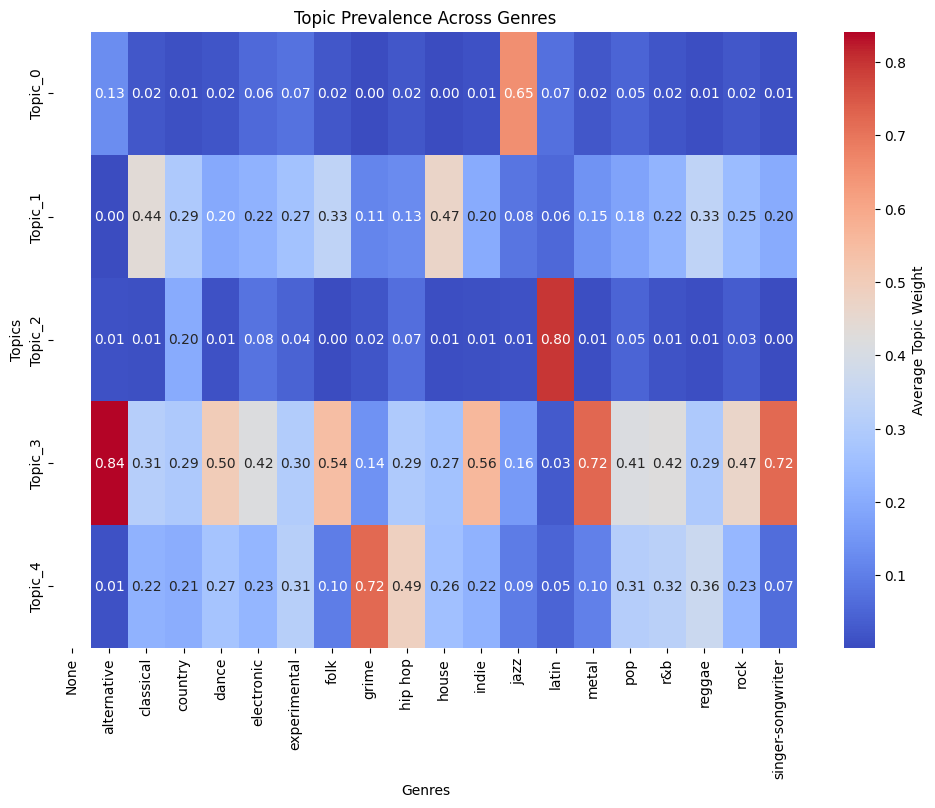

In [96]:
import numpy as np
import pandas as pd

# Get topic distributions for each song
topic_distributions = lda.transform(X_lyrics)

# Add topic weights to the DataFrame
topic_columns = [f"Topic_{i}" for i in range(lda.n_components)]
df_topics = pd.DataFrame(topic_distributions, columns=topic_columns, index=lyrics_texts.index)
df = df.join(df_topics)

# Group by genre and calculate mean topic proportions
topic_genre_means = df.groupby('genre')[topic_columns].mean()

# Visualize topic prevalence by genre
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.heatmap(topic_genre_means.T, cmap="coolwarm", annot=True, fmt=".2f", cbar_kws={'label': 'Average Topic Weight'})
plt.title("Topic Prevalence Across Genres")
plt.xlabel("Genres")
plt.ylabel("Topics")
plt.show()


# Impact of Acoustic and Textual Interplay
Objective: Investigate how textual features amplify acoustic features' effect on popularity.

Correlation between sentiment and valence: 0.044, p-value = 0.002


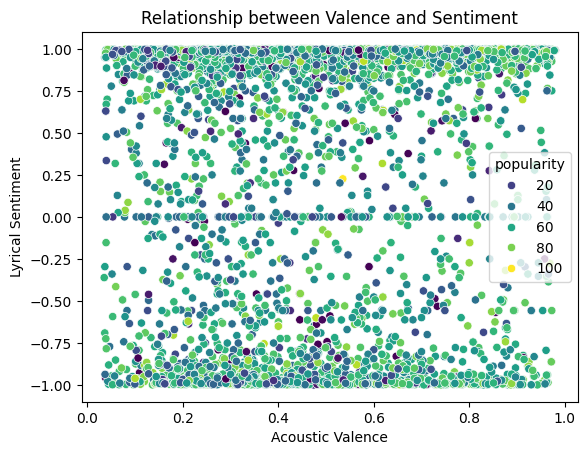

In [100]:
import scipy.stats as stats

# Correlation between sentiment (vader_compound) and valence
sentiment = df['vader_compound']
valence = df['valence']

correlation, p_value = stats.pearsonr(sentiment, valence)
print(f"Correlation between sentiment and valence: {correlation:.3f}, p-value = {p_value:.3f}")

# Scatterplot
sns.scatterplot(x=valence, y=sentiment, hue=df['popularity'], palette="viridis")
plt.title("Relationship between Valence and Sentiment")
plt.xlabel("Acoustic Valence")
plt.ylabel("Lyrical Sentiment")
plt.show()


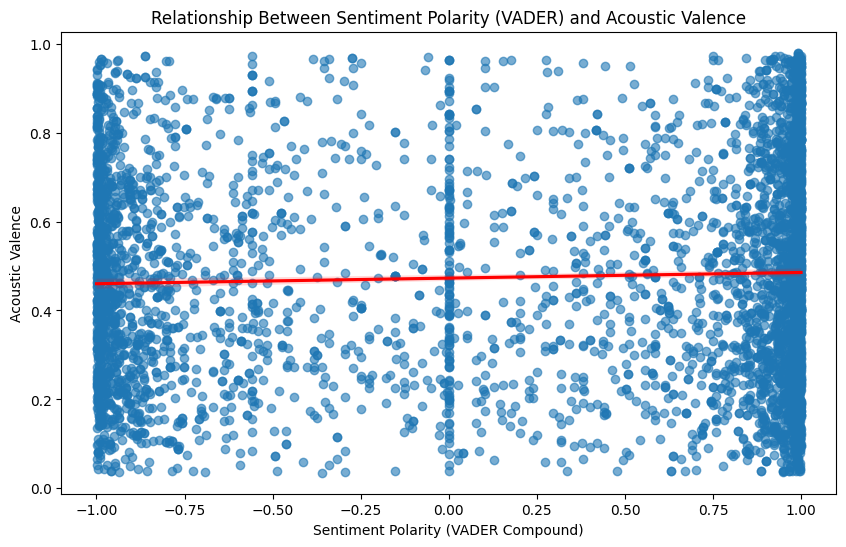

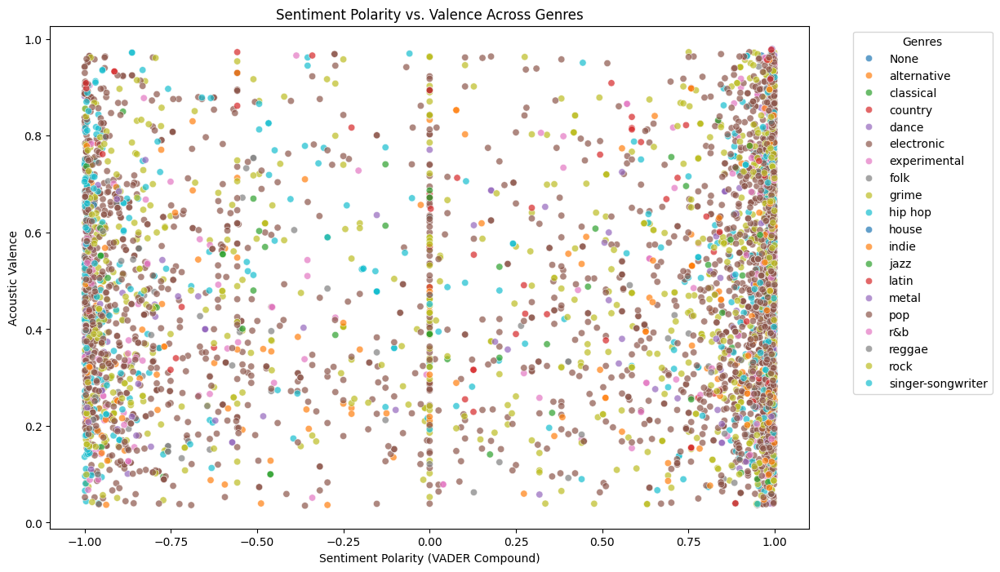

In [101]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Scatterplot with regression line
plt.figure(figsize=(10, 6))
sns.regplot(
    x='vader_compound', 
    y='valence', 
    data=df, 
    scatter_kws={'alpha': 0.6}, 
    line_kws={'color': 'red'}
)
plt.title("Relationship Between Sentiment Polarity (VADER) and Acoustic Valence")
plt.xlabel("Sentiment Polarity (VADER Compound)")
plt.ylabel("Acoustic Valence")
plt.show()

# Optional: Scatterplot with genres as hue
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='vader_compound', 
    y='valence', 
    hue='genre', 
    data=df, 
    palette='tab10', 
    alpha=0.7
)
plt.title("Sentiment Polarity vs. Valence Across Genres")
plt.xlabel("Sentiment Polarity (VADER Compound)")
plt.ylabel("Acoustic Valence")
plt.legend(title="Genres", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [102]:
from scipy.stats import pearsonr

# Compute correlation
correlation, p_value = pearsonr(df['vader_compound'], df['valence'])
print(f"Correlation between sentiment polarity and valence: {correlation:.3f}, p-value: {p_value:.3e}")

# Interpretation
if p_value < 0.05:
    print("The correlation is statistically significant.")
else:
    print("The correlation is not statistically significant.")


Correlation between sentiment polarity and valence: 0.044, p-value: 1.688e-03
The correlation is statistically significant.


Correlation coefficient: 0.044
This indicates a very weak positive linear relationship. Sentiment polarity slightly aligns with valence, but the relationship is minimal.

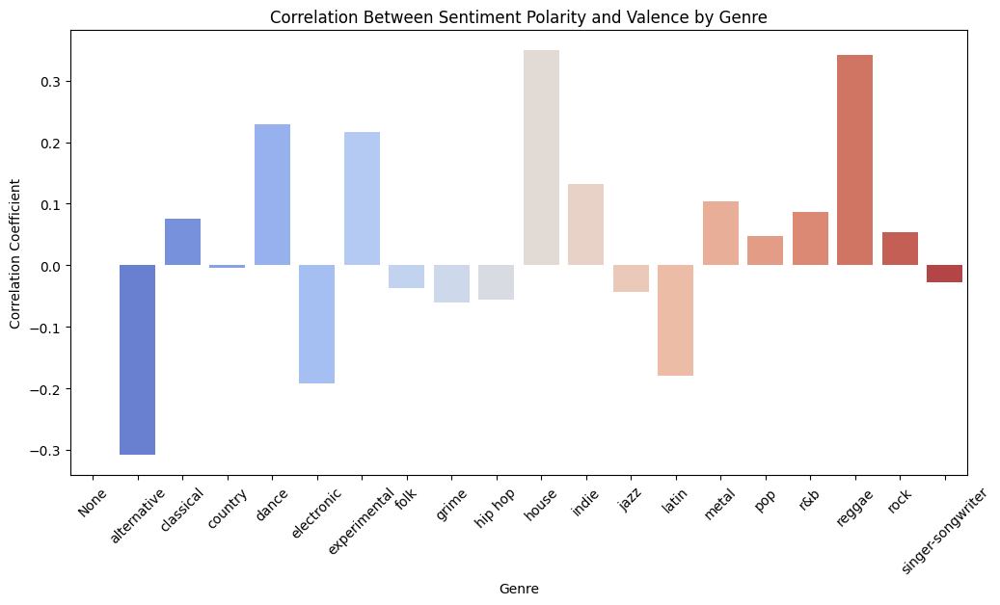

In [103]:
# Group by genre and calculate correlations
genre_correlations = (
    df.groupby('genre')[['vader_compound', 'valence']]
    .corr().unstack().iloc[:, 1]  # Extract correlation between 'vader_compound' and 'valence'
)

# Plot correlations per genre
genre_correlations = genre_correlations.reset_index()
genre_correlations.columns = ['genre', 'correlation']
plt.figure(figsize=(12, 6))
sns.barplot(x='genre', y='correlation', data=genre_correlations, palette='coolwarm')
plt.title("Correlation Between Sentiment Polarity and Valence by Genre")
plt.xlabel("Genre")
plt.ylabel("Correlation Coefficient")
plt.xticks(rotation=45)
plt.show()


# Change in features over time
Looking for trends in features over time by plotting features with highest correlation with album_release_year

In [117]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute correlations with album_release_year
correlations = df.corr()['album_release_year'].sort_values(ascending=False)

# Display the top 10 features most correlated with album release year
print("Top Features Correlated with Album Release Year:")
print(correlations.head(10))

# Extract top features
top_features = correlations.head(10).index


Top Features Correlated with Album Release Year:
album_release_year         1.000000
mfcc_3                     0.342181
repetition_count           0.195673
spectral_contrast_2        0.177705
text_acoustic_interplay    0.174282
loudness                   0.171083
tfidf_3                    0.143689
spectral_contrast_3        0.143179
syllable_count             0.117180
word_count                 0.114399
Name: album_release_year, dtype: float64


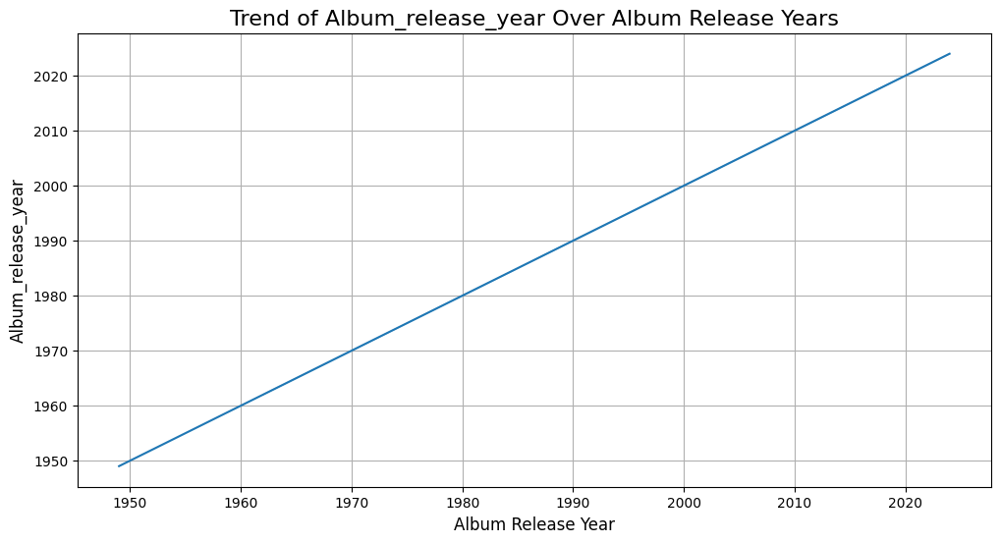

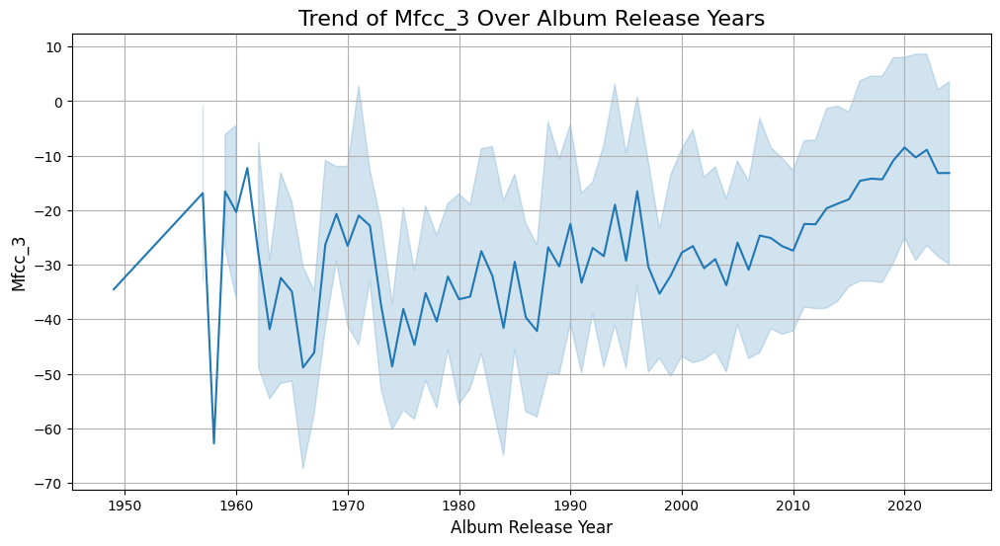

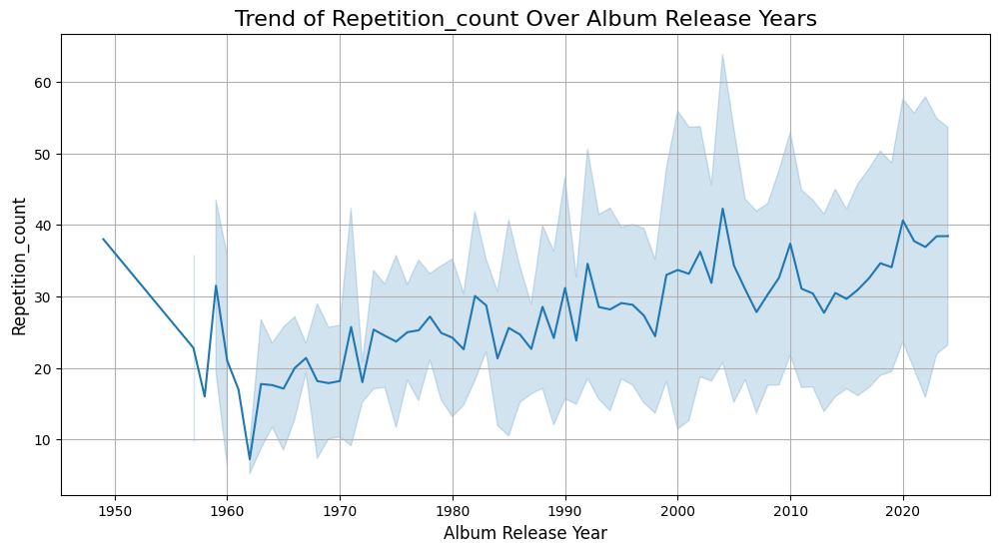

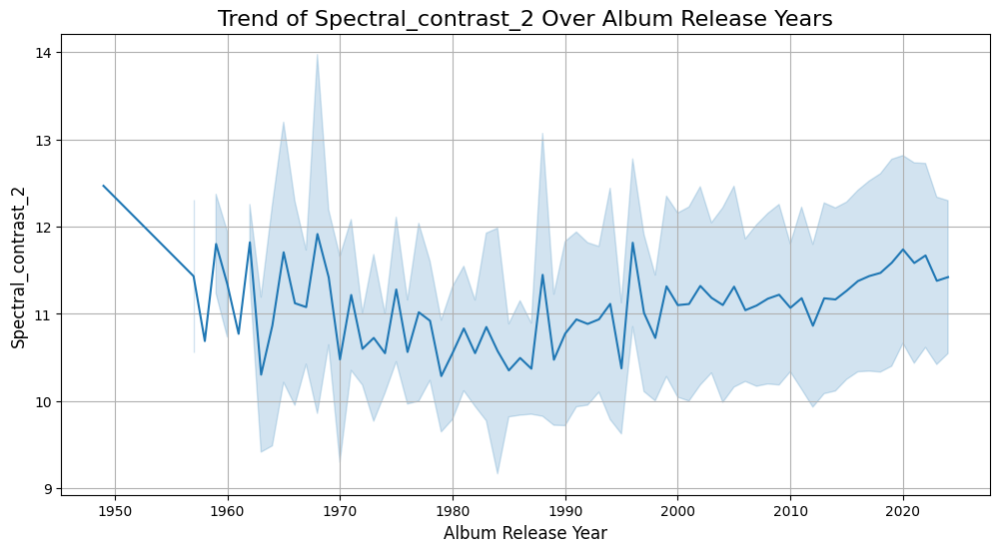

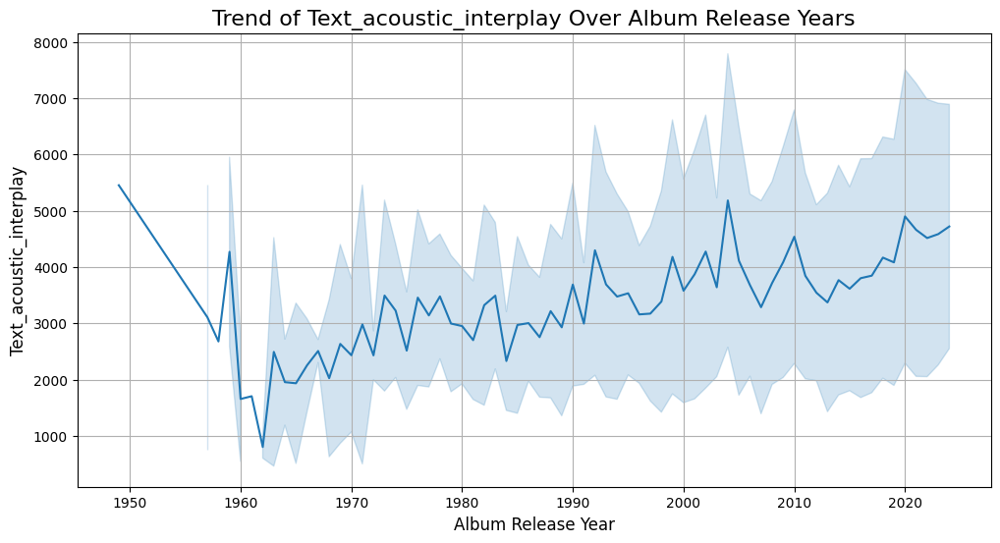

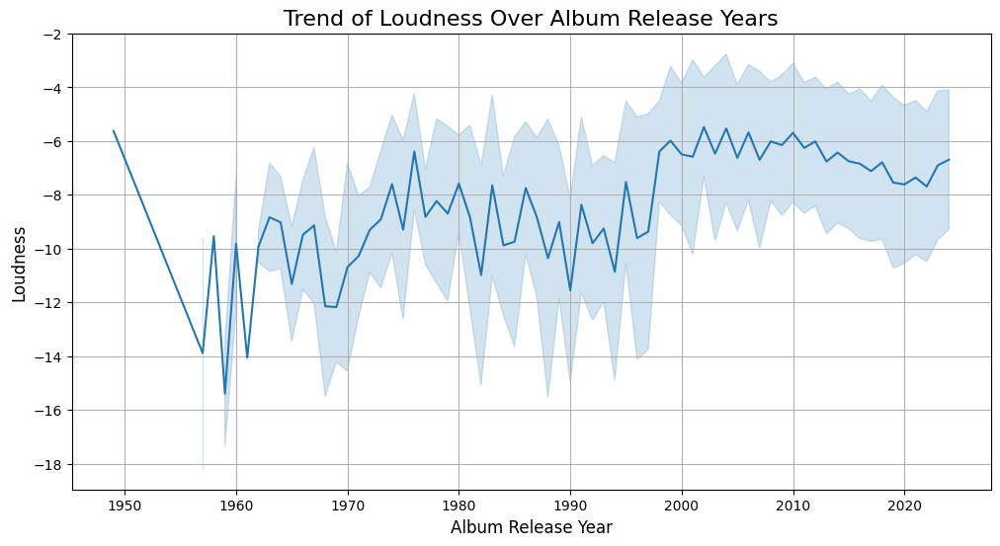

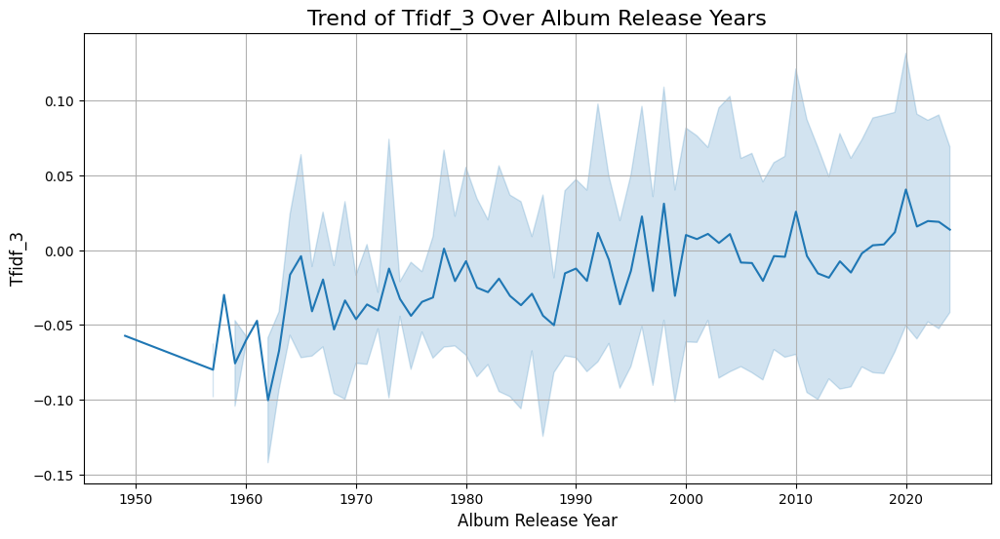

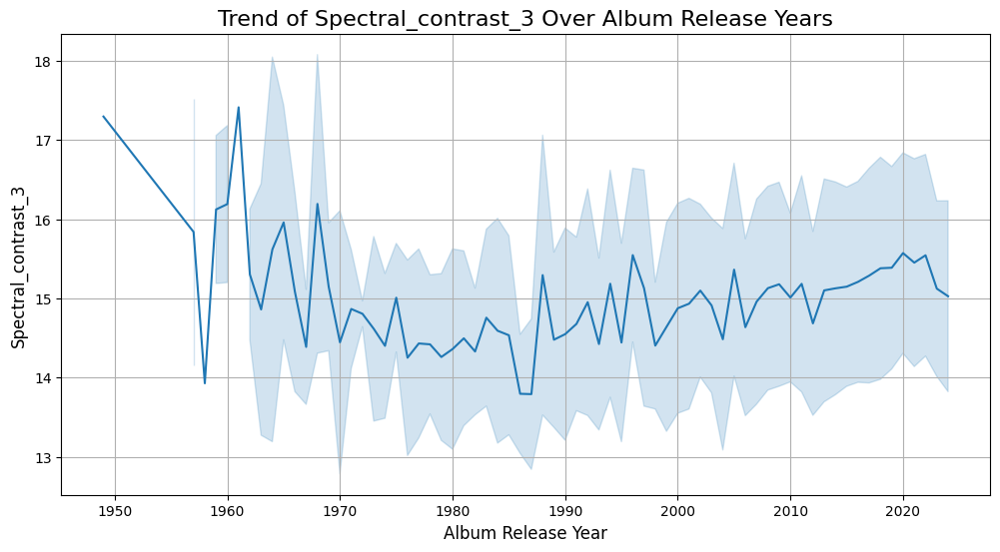

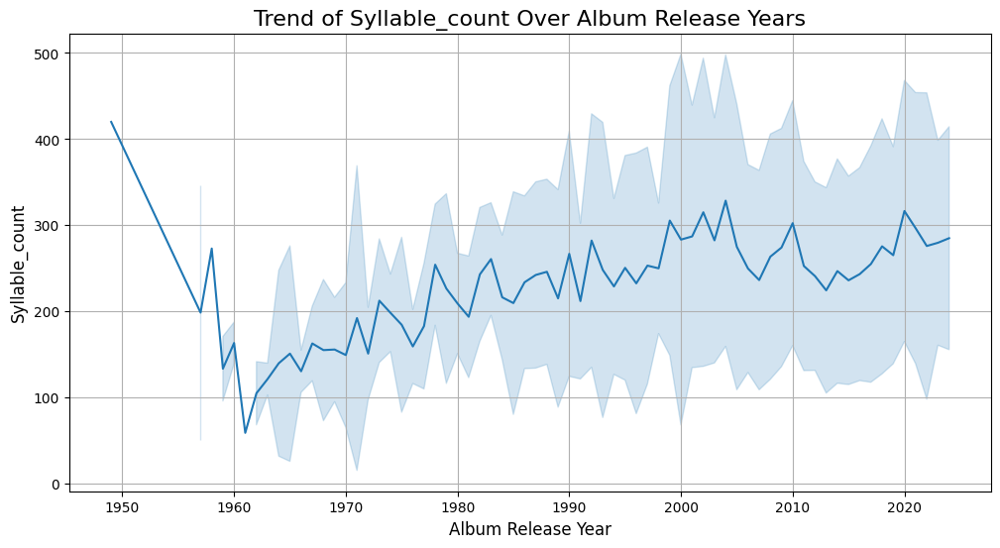

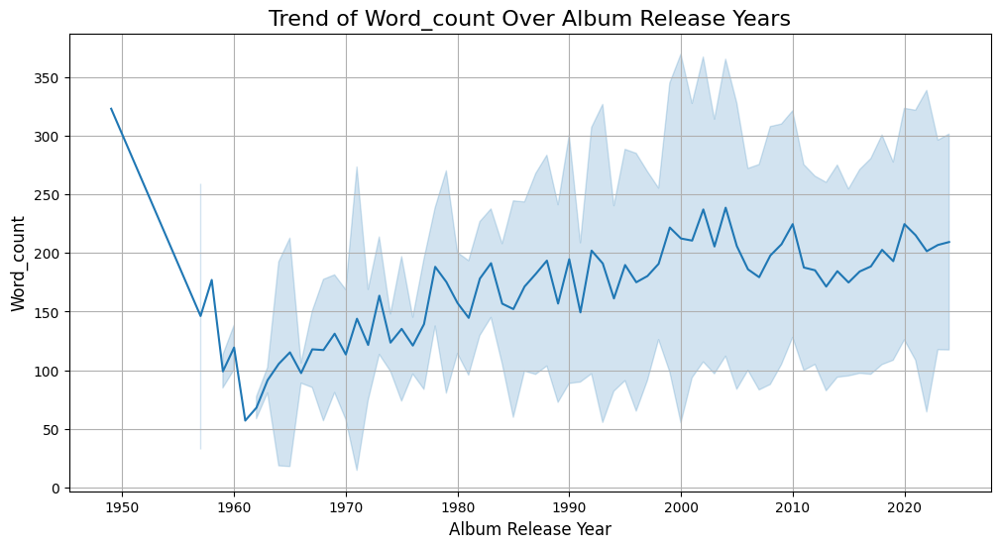

In [118]:
# Plot trends for the top correlated features
for feature in top_features:
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df, x='album_release_year', y=feature, ci='sd')  # Add confidence intervals
    plt.title(f'Trend of {feature.capitalize()} Over Album Release Years', fontsize=16)
    plt.xlabel('Album Release Year', fontsize=12)
    plt.ylabel(f'{feature.capitalize()}', fontsize=12)
    plt.grid(True)
    plt.show()


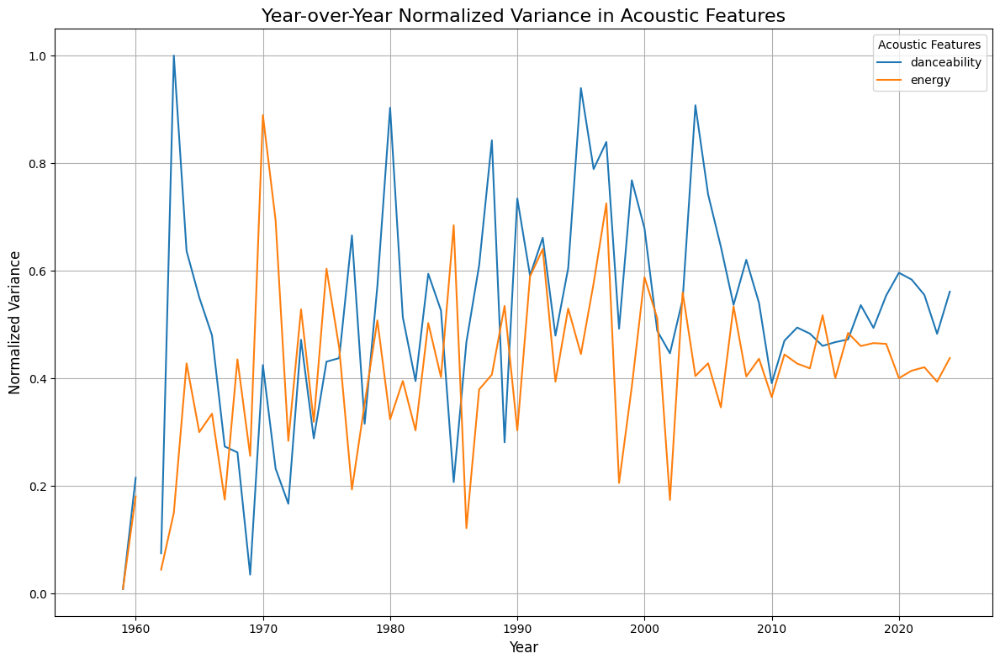

In [139]:
# I think this doesnt make sense since i have more samples for newer songs
import matplotlib.pyplot as plt
import seaborn as sns

# Select acoustic features for analysis
acoustic_features = ['danceability', 'energy',]# 'loudness', 'valence', 'tempo']

# Calculate year-over-year variance for acoustic features
feature_variance = df.groupby('album_release_year')[acoustic_features].var()

# Normalize the variance values for each feature
normalized_variance = feature_variance / feature_variance.max()

# Plot the normalized variance of each feature over time
plt.figure(figsize=(12, 8))
for feature in acoustic_features:
    plt.plot(normalized_variance.index, normalized_variance[feature], label=feature)

plt.title("Year-over-Year Normalized Variance in Acoustic Features", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Normalized Variance", fontsize=12)
plt.legend(title="Acoustic Features")
plt.grid(True)
plt.tight_layout()
plt.show()


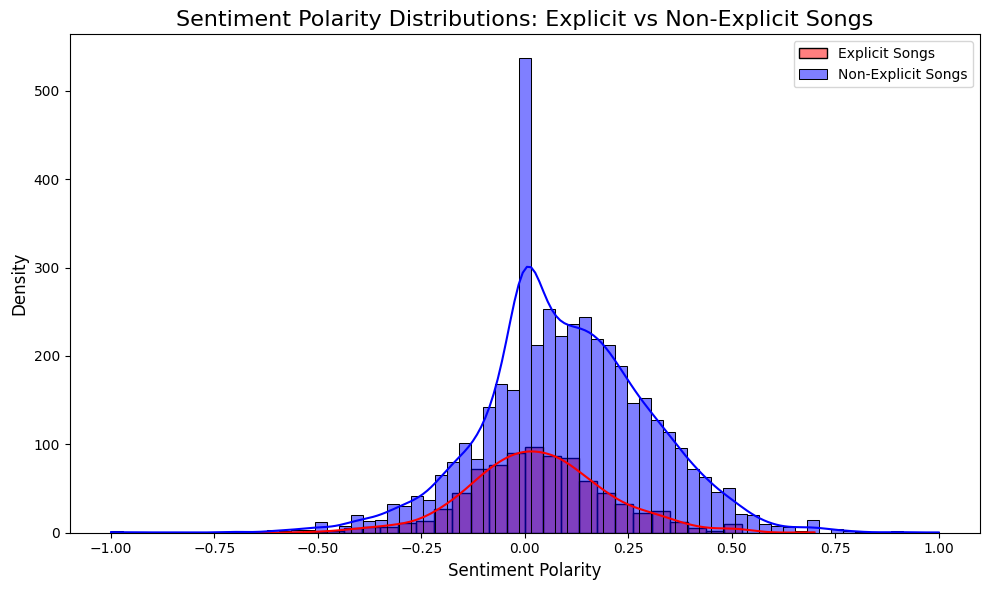

T-Test Results: t-statistic = -8.859, p-value = 1.094e-18
Reject H₀: Significant difference in sentiment polarity between explicit and non-explicit songs.


In [141]:
from scipy.stats import ttest_ind

# Separate explicit and non-explicit songs
explicit_songs = df[df['explicit'] == '1']
non_explicit_songs = df[df['explicit'] == '0']

# Calculate mean sentiment polarity for explicit vs. non-explicit songs
explicit_polarity = explicit_songs['sentiment_polarity'].dropna()
non_explicit_polarity = non_explicit_songs['sentiment_polarity'].dropna()

# Perform t-test to compare the distributions
t_stat, p_value = ttest_ind(explicit_polarity, non_explicit_polarity)

# Plot the distributions
plt.figure(figsize=(10, 6))
sns.histplot(explicit_polarity, kde=True, color="red", label="Explicit Songs")
sns.histplot(non_explicit_polarity, kde=True, color="blue", label="Non-Explicit Songs")
plt.title("Sentiment Polarity Distributions: Explicit vs Non-Explicit Songs", fontsize=16)
plt.xlabel("Sentiment Polarity", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()

# Display results
print(f"T-Test Results: t-statistic = {t_stat:.3f}, p-value = {p_value:.3e}")
if p_value < 0.05:
    print("Reject H₀: Significant difference in sentiment polarity between explicit and non-explicit songs.")
else:
    print("Fail to reject H₀: No significant difference in sentiment polarity.")


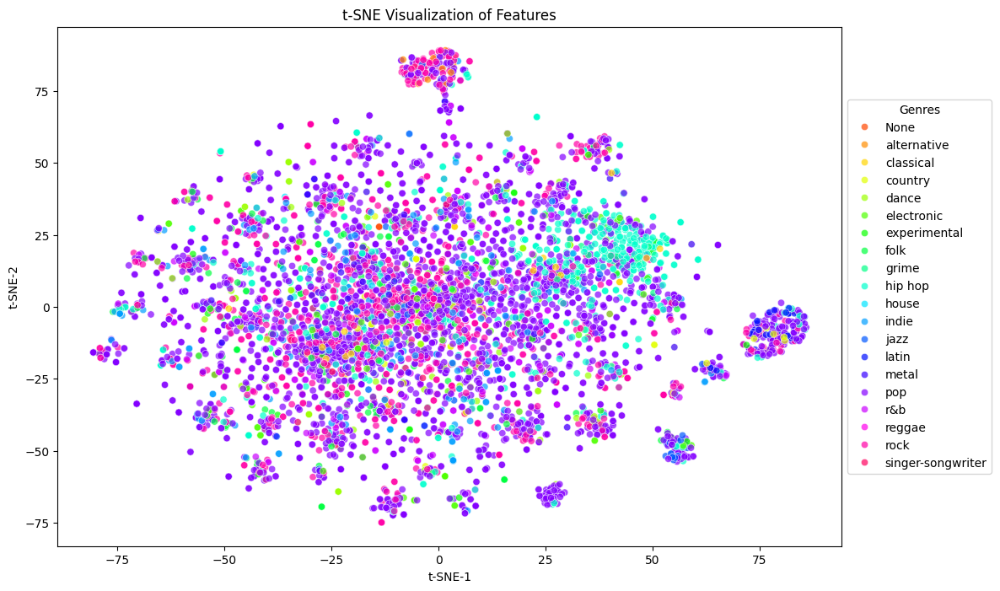

In [162]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import seaborn as sns

features = tfidf_features + lyrical_features + acoustic_features
# Features and labels
features = df[features].values  # Replace with your features
labels = df["genre"]  # Replace with your categorical variable

# Normalize features
scaler = StandardScaler()
normalized_features = scaler.fit_transform(features)

# Apply t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
tsne_results = tsne.fit_transform(normalized_features)

# Add t-SNE results to the DataFrame
df["t-SNE-1"] = tsne_results[:, 0]
df["t-SNE-2"] = tsne_results[:, 1]

# Plotting
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x="t-SNE-1", y="t-SNE-2", 
    hue=labels, 
    palette=sns.color_palette("hsv", len(df["genre"].unique())), 
    data=df,
    legend="full",
    alpha=0.7
)
plt.title("t-SNE Visualization of Features")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Genres")
plt.show()
